# Face Generation
In this project, you'll use generative adversarial networks to generate new images of faces.
### Get the Data
You'll be using two datasets in this project:
- MNIST
- CelebA

Since the celebA dataset is complex and you're doing GANs in a project for the first time, we want you to test your neural network on MNIST before CelebA.  Running the GANs on MNIST will allow you to see how well your model trains sooner.

If you're using [FloydHub](https://www.floydhub.com/), set `data_dir` to "/input" and use the [FloydHub data ID](http://docs.floydhub.com/home/using_datasets/) "R5KrjnANiKVhLWAkpXhNBe".

In [1]:
data_dir = './data'

# FloydHub - Use with data ID "R5KrjnANiKVhLWAkpXhNBe"
#data_dir = '/input'


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import helper

helper.download_extract('mnist', data_dir)
helper.download_extract('celeba', data_dir)

Found mnist Data
Found celeba Data


## Explore the Data
### MNIST
As you're aware, the [MNIST](http://yann.lecun.com/exdb/mnist/) dataset contains images of handwritten digits. You can view the first number of examples by changing `show_n_images`. 

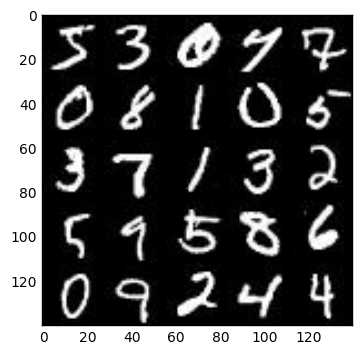

In [2]:
show_n_images = 25
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
%matplotlib inline
import os
from glob import glob
from matplotlib import pyplot

mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'mnist/*.jpg'))[:show_n_images], 28, 28, 'L')
pyplot.imshow(helper.images_square_grid(mnist_images, 'L'), cmap='gray')

### CelebA
The [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations.  Since you're going to be generating faces, you won't need the annotations.  You can view the first number of examples by changing `show_n_images`.

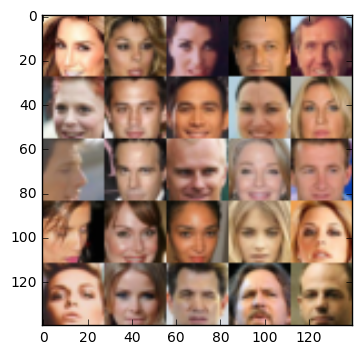

In [3]:
show_n_images = 25

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
mnist_images = helper.get_batch(glob(os.path.join(data_dir, 'img_align_celeba/*.jpg'))[:show_n_images], 28, 28, 'RGB')
pyplot.imshow(helper.images_square_grid(mnist_images, 'RGB'))

## Preprocess the Data
Since the project's main focus is on building the GANs, we'll preprocess the data for you.  The values of the MNIST and CelebA dataset will be in the range of -0.5 to 0.5 of 28x28 dimensional images.  The CelebA images will be cropped to remove parts of the image that don't include a face, then resized down to 28x28.

The MNIST images are black and white images with a single [color channel](https://en.wikipedia.org/wiki/Channel_(digital_image%29) while the CelebA images have [3 color channels (RGB color channel)](https://en.wikipedia.org/wiki/Channel_(digital_image%29#RGB_Images).
## Build the Neural Network
You'll build the components necessary to build a GANs by implementing the following functions below:
- `model_inputs`
- `discriminator`
- `generator`
- `model_loss`
- `model_opt`
- `train`

### Check the Version of TensorFlow and Access to GPU
This will check to make sure you have the correct version of TensorFlow and access to a GPU

In [4]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
from distutils.version import LooseVersion
import warnings
import tensorflow as tf

# Check TensorFlow Version
assert LooseVersion(tf.__version__) >= LooseVersion('1.0'), 'Please use TensorFlow version 1.0 or newer.  You are using {}'.format(tf.__version__)
print('TensorFlow Version: {}'.format(tf.__version__))

# Check for a GPU
if not tf.test.gpu_device_name():
    warnings.warn('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Default GPU Device: {}'.format(tf.test.gpu_device_name()))

TensorFlow Version: 1.0.1


C:\Anaconda3\lib\site-packages\ipykernel\__main__.py:14: UserWarning: No GPU found. Please use a GPU to train your neural network.


### Input
Implement the `model_inputs` function to create TF Placeholders for the Neural Network. It should create the following placeholders:
- Real input images placeholder with rank 4 using `image_width`, `image_height`, and `image_channels`.
- Z input placeholder with rank 2 using `z_dim`.
- Learning rate placeholder with rank 0.

Return the placeholders in the following the tuple (tensor of real input images, tensor of z data)

In [5]:
import problem_unittests as tests

def model_inputs(image_width, image_height, image_channels, z_dim):
    """
    Create the model inputs
    :param image_width: The input image width
    :param image_height: The input image height
    :param image_channels: The number of image channels
    :param z_dim: The dimension of Z
    :return: Tuple of (tensor of real input images, tensor of z data, learning rate)
    """
    # TODO: Implement Function
    
    # ================================================================================================
    # Real input images placeholder with rank 4 using image_width, image_height, and image_channels.
    # ================================================================================================
    input_real = tf.placeholder(tf.float32, [None, image_width, image_height, image_channels], "input_real")
        
    # ===============================================
    # Z input placeholder with rank 2 using `z_dim`.
    # ===============================================
    input_z = tf.placeholder(tf.float32, [None, z_dim], "input_z")
    
    # =======================================
    # Learning rate placeholder with rank 0.
    # =======================================
    learning_rate = tf.placeholder(tf.float32, None, "learning_rate")

    return input_real, input_z, learning_rate



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_inputs(model_inputs)

Tests Passed


### Discriminator
Implement `discriminator` to create a discriminator neural network that discriminates on `images`.  This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "discriminator" to allow the variables to be reused.  The function should return a tuple of (tensor output of the discriminator, tensor logits of the discriminator).

In [6]:
def conv(inputs, filters, batch_norm):
        xavier_initializer = tf.contrib.layers.xavier_initializer(uniform=True, seed=None, dtype=tf.float32)
        outputs = tf.layers.conv2d(inputs, filters, 5, 2, 'same', kernel_initializer=xavier_initializer)
        if batch_norm:
            outputs = tf.layers.batch_normalization(outputs, training=True)
        return tf.maximum(0.2 * outputs, outputs)

In [7]:
def discriminator(images, reuse=False):
    """
    Create the discriminator network
    :param images: Tensor of input image(s)
    :param reuse: Boolean if the weights should be reused
    :return: Tuple of (tensor output of the discriminator, tensor logits of the discriminator)
    """
    # TODO: Implement Function        
    
    with tf.variable_scope("discriminator", reuse=reuse):
        # ==============================================
        # x1 of dimension 14*14*64
        # Not to do batch_normalisation in the 1st layer
        # ==============================================
        x1 = conv(images, 64, False) 
        x1 = tf.nn.dropout(x1, 0.7)

        
        # ===================================
        # x1 of dimension 7*7*128
        # ===================================
        x2 = conv(x1, 128, True) # 7*7*128
        x2 = tf.nn.dropout(x2, 0.7)
        
        # ===================================
        # x1 of dimension 4*4*256
        # ===================================
        x3 = conv(x2, 256, True) 
        x3 = tf.nn.dropout(x3, 0.7)
        
        # ===============================================================
        # flatten the x3 to give it as input to fully connected layer
        # ===============================================================
        flat = tf.reshape(x3, (-1, 4*4*256))
        logits = tf.layers.dense(flat, 1)
        logits = tf.nn.dropout(logits, 0.7)

        
        # ===============================================
        # sigmoidal function is the activation function
        # ===============================================
        out = tf.sigmoid(logits)

        return out, logits


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(discriminator, tf)

Tests Passed


### Generator
Implement `generator` to generate an image using `z`. This function should be able to reuse the variables in the neural network.  Use [`tf.variable_scope`](https://www.tensorflow.org/api_docs/python/tf/variable_scope) with a scope name of "generator" to allow the variables to be reused. The function should return the generated 28 x 28 x `out_channel_dim` images.

In [14]:
def generator(z, out_channel_dim, is_train=True):
    """
    Create the generator network
    :param z: Input z
    :param out_channel_dim: The number of channels in the output image
    :param is_train: Boolean if generator is being used for training
    :return: The tensor output of the generator
    """
    alpha = 0.2
    keep_prob = 0.7
    # TODO: Implement Function
    with tf.variable_scope("generator", reuse=not is_train):
        
        # ===============================================
        # Construct feature map of 7*7*512
        # ===============================================
        g1 = tf.layers.dense(z, 7*7*512)
        g1 = tf.reshape(g1, (-1, 7, 7, 512))
        g1 = tf.layers.batch_normalization(g1, training=is_train)
        g1 = tf.maximum(alpha * g1, g1)
      
        # ===============================================
        # Construct feature map of 7*7*256
        # ===============================================
        g2 = tf.layers.conv2d_transpose(g1, 256, 5, strides=2, padding='same', activation=None)
        g2 = tf.layers.batch_normalization(g2, training=is_train)
        g2 = tf.maximum(alpha * g2, g2)
        g2 = tf.nn.dropout(g2, keep_prob=keep_prob)

        
        # ===============================================
        # Construct feature map of 7*7*128
        # ===============================================
        g3 = tf.layers.conv2d_transpose(g2, 128, 5, strides=2, padding='same', activation=None)
        g3 = tf.layers.batch_normalization(g3, training=is_train)
        g3 = tf.maximum(alpha * g3, g3)   
        g3 = tf.nn.dropout(g3, keep_prob=keep_prob)
       
    
        # ===============================================
        # Construct feature map of 28*28*out_channel_dim
        # ===============================================
        # xavier_initializer = tf.contrib.layers.xavier_initializer(uniform=True, seed=None, dtype=tf.float32)
        logits = tf.layers.conv2d_transpose(g3, out_channel_dim, 3, strides=1, padding='same', activation=None)        
        out = tf.tanh(logits)
        # print("out", out.shape)
        
        return out


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(generator, tf)

Tests Passed


### Loss
Implement `model_loss` to build the GANs for training and calculate the loss.  The function should return a tuple of (discriminator loss, generator loss).  Use the following functions you implemented:
- `discriminator(images, reuse=False)`
- `generator(z, out_channel_dim, is_train=True)`

In [15]:
def model_loss(input_real, input_z, out_channel_dim):
    """
    Get the loss for the discriminator and generator
    :param input_real: Images from the real dataset
    :param input_z: Z input
    :param out_channel_dim: The number of channels in the output image
    :return: A tuple of (discriminator loss, generator loss)
    """
    # TODO: Implement Function
    
    g_model = generator(input_z, out_channel_dim)
    
    d_model_real, d_logits_real = discriminator(input_real)
    
    d_model_fake, d_logits_fake = discriminator(g_model, reuse=True)

    d_loss_real = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_real, labels=tf.ones_like(d_logits_real) * 0.9))
    
    d_loss_fake = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.zeros_like(d_logits_fake)))
    
    g_loss = tf.reduce_mean(tf.nn.sigmoid_cross_entropy_with_logits(logits=d_logits_fake, labels=tf.ones_like(d_logits_fake)))

    d_loss = d_loss_real + d_loss_fake

    return d_loss, g_loss



"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_loss(model_loss)

Tests Passed


### Optimization
Implement `model_opt` to create the optimization operations for the GANs. Use [`tf.trainable_variables`](https://www.tensorflow.org/api_docs/python/tf/trainable_variables) to get all the trainable variables.  Filter the variables with names that are in the discriminator and generator scope names.  The function should return a tuple of (discriminator training operation, generator training operation).

In [16]:
def model_opt(d_loss, g_loss, learning_rate, beta1):
    """
    Get optimization operations
    :param d_loss: Discriminator loss Tensor
    :param g_loss: Generator loss Tensor
    :param learning_rate: Learning Rate Placeholder
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :return: A tuple of (discriminator training operation, generator training operation)
    """
    # TODO: Implement Function
    
    update_ops = tf.get_collection(tf.GraphKeys.UPDATE_OPS)
    
    with tf.control_dependencies(update_ops):
        
        t_vars = tf.trainable_variables()
        
        d_vars = list([])
        for var in t_vars:
            if var.name.startswith('discriminator'):
                d_vars.append(var)
        d_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(d_loss, var_list=d_vars)
            
        g_vars = list([])
        for var in t_vars:
            if var.name.startswith('generator'):
                g_vars.append(var)
        g_train_opt = tf.train.AdamOptimizer(learning_rate, beta1=beta1).minimize(g_loss, var_list=g_vars)

    return d_train_opt, g_train_opt

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_model_opt(model_opt, tf)

Tests Passed


## Neural Network Training
### Show Output
Use this function to show the current output of the generator during training. It will help you determine how well the GANs is training.

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import numpy as np

def show_generator_output(sess, n_images, input_z, out_channel_dim, image_mode):
    """
    Show example output for the generator
    :param sess: TensorFlow session
    :param n_images: Number of Images to display
    :param input_z: Input Z Tensor
    :param out_channel_dim: The number of channels in the output image
    :param image_mode: The mode to use for images ("RGB" or "L")
    """
    cmap = None if image_mode == 'RGB' else 'gray'
    z_dim = input_z.get_shape().as_list()[-1]
    example_z = np.random.uniform(-1, 1, size=[n_images, z_dim])

    samples = sess.run(
        generator(input_z, out_channel_dim, False),
        feed_dict={input_z: example_z})

    images_grid = helper.images_square_grid(samples, image_mode)
    pyplot.imshow(images_grid, cmap=cmap)
    pyplot.show()

### Train
Implement `train` to build and train the GANs.  Use the following functions you implemented:
- `model_inputs(image_width, image_height, image_channels, z_dim)`
- `model_loss(input_real, input_z, out_channel_dim)`
- `model_opt(d_loss, g_loss, learning_rate, beta1)`

Use the `show_generator_output` to show `generator` output while you train. Running `show_generator_output` for every batch will drastically increase training time and increase the size of the notebook.  It's recommended to print the `generator` output every 100 batches.

In [18]:
def train(epoch_count, batch_size, z_dim, learning_rate, beta1, get_batches, data_shape, data_image_mode):
    """
    Train the GAN
    :param epoch_count: Number of epochs
    :param batch_size: Batch Size
    :param z_dim: Z dimension
    :param learning_rate: Learning Rate
    :param beta1: The exponential decay rate for the 1st moment in the optimizer
    :param get_batches: Function to get batches
    :param data_shape: Shape of the data
    :param data_image_mode: The image mode to use for images ("RGB" or "L")
    """
    # TODO: Build Model
    input_real, input_z, lr = model_inputs(data_shape[1], data_shape[2], data_shape[3], z_dim)

    d_loss, g_loss = model_loss(input_real, input_z, data_shape[3])

    d_opt, g_opt = model_opt(d_loss, g_loss, lr, beta1)
    
    
    
    with tf.Session() as sess:
        sess.run(tf.global_variables_initializer())
        for epoch_i in range(epoch_count):
            steps = 0
            for batch_images in get_batches(batch_size):
                # TODO: Train Model
                steps = steps + 1
                batch_images = batch_images * 2
                batch_z = np.random.uniform(-1, 1, size=(batch_size, z_dim))
                # =============================
                # Run discriminator optimizer
                # =============================
                _ = sess.run(d_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                # =============================
                # Run generator optimizer
                # =============================
                _ = sess.run(g_opt, feed_dict={input_real: batch_images, input_z: batch_z, lr: learning_rate})
                
                if steps % 10 == 0:
                    train_loss_d = d_loss.eval({input_real: batch_images, input_z: batch_z})
                    train_loss_g = g_loss.eval({input_z: batch_z})

                    print("Epoch {}/{}...".format(epoch_i+1, epochs),
                          "Batch {}...".format(steps),
                          "Discriminator Loss: {:.4f}...".format(train_loss_d),
                          "Generator Loss: {:.4f}".format(train_loss_g))

                if steps % 20 == 0:
                    show_generator_output(sess, show_n_images, input_z, data_shape[3], data_image_mode)

### MNIST
Test your GANs architecture on MNIST.  After 2 epochs, the GANs should be able to generate images that look like handwritten digits.  Make sure the loss of the generator is lower than the loss of the discriminator or close to 0.

Epoch 1/2... Batch 10... Discriminator Loss: 0.7027... Generator Loss: 3.5133
Epoch 1/2... Batch 20... Discriminator Loss: 0.8066... Generator Loss: 4.4179


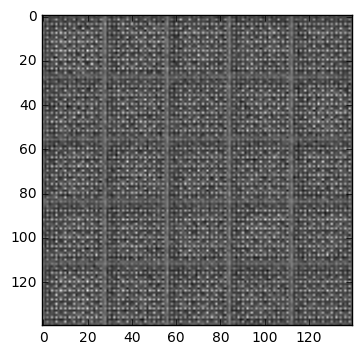

Epoch 1/2... Batch 30... Discriminator Loss: 0.9205... Generator Loss: 2.8783
Epoch 1/2... Batch 40... Discriminator Loss: 0.7294... Generator Loss: 4.3088


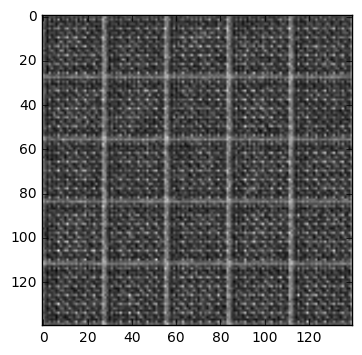

Epoch 1/2... Batch 50... Discriminator Loss: 0.9425... Generator Loss: 2.1194
Epoch 1/2... Batch 60... Discriminator Loss: 0.8173... Generator Loss: 3.7038


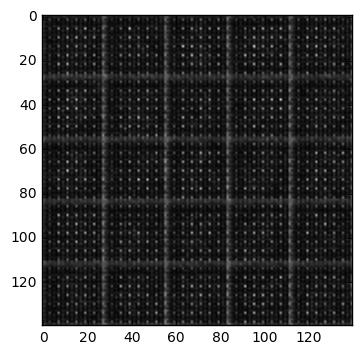

Epoch 1/2... Batch 70... Discriminator Loss: 0.7892... Generator Loss: 3.0889
Epoch 1/2... Batch 80... Discriminator Loss: 0.8385... Generator Loss: 4.4728


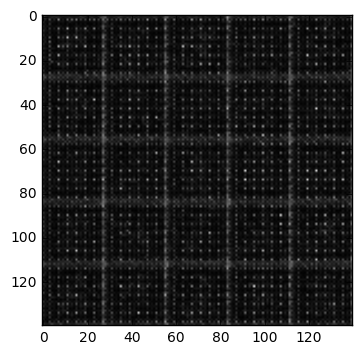

Epoch 1/2... Batch 90... Discriminator Loss: 1.4114... Generator Loss: 1.3108
Epoch 1/2... Batch 100... Discriminator Loss: 1.2808... Generator Loss: 1.2905


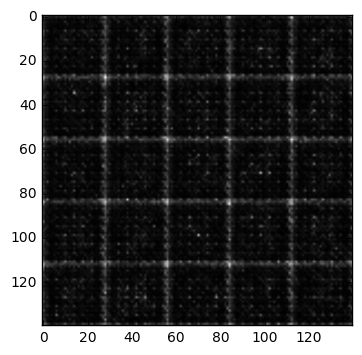

Epoch 1/2... Batch 110... Discriminator Loss: 2.8228... Generator Loss: 0.5287
Epoch 1/2... Batch 120... Discriminator Loss: 2.1478... Generator Loss: 0.4171


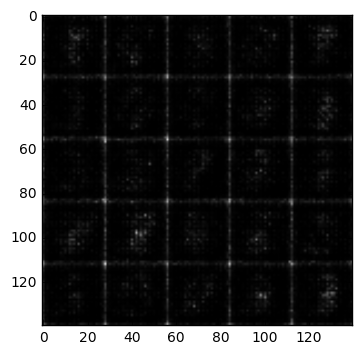

Epoch 1/2... Batch 130... Discriminator Loss: 1.4538... Generator Loss: 0.8448
Epoch 1/2... Batch 140... Discriminator Loss: 1.6473... Generator Loss: 1.5277


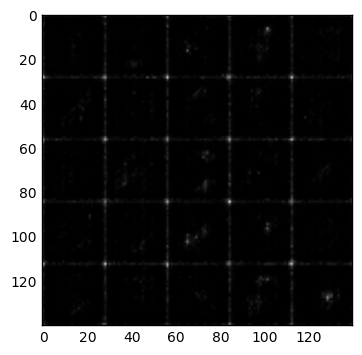

Epoch 1/2... Batch 150... Discriminator Loss: 1.6502... Generator Loss: 0.5537
Epoch 1/2... Batch 160... Discriminator Loss: 1.4960... Generator Loss: 0.8921


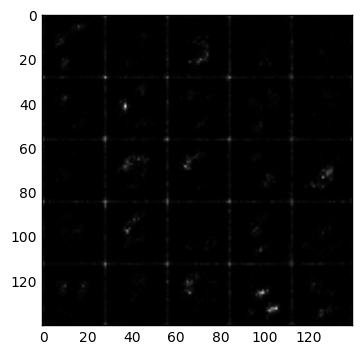

Epoch 1/2... Batch 170... Discriminator Loss: 1.6071... Generator Loss: 0.6504
Epoch 1/2... Batch 180... Discriminator Loss: 1.7404... Generator Loss: 0.7115


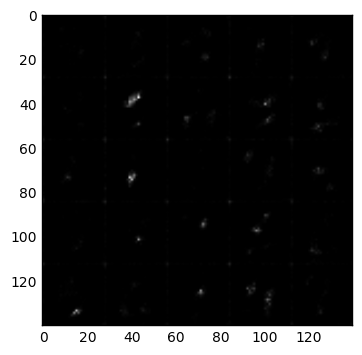

Epoch 1/2... Batch 190... Discriminator Loss: 1.5737... Generator Loss: 1.8798
Epoch 1/2... Batch 200... Discriminator Loss: 1.3958... Generator Loss: 0.8616


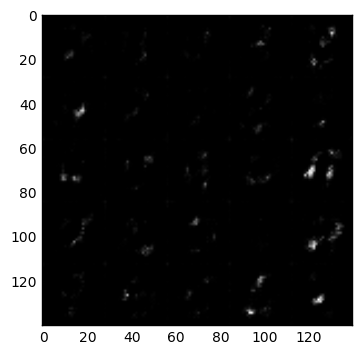

Epoch 1/2... Batch 210... Discriminator Loss: 1.6467... Generator Loss: 1.6332
Epoch 1/2... Batch 220... Discriminator Loss: 1.6161... Generator Loss: 0.8124


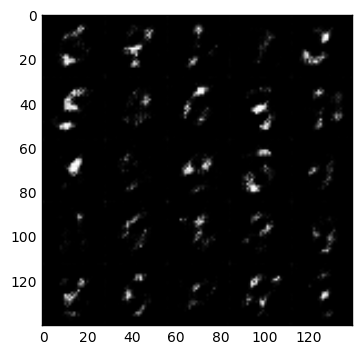

Epoch 1/2... Batch 230... Discriminator Loss: 1.5094... Generator Loss: 0.7512
Epoch 1/2... Batch 240... Discriminator Loss: 1.6534... Generator Loss: 1.5015


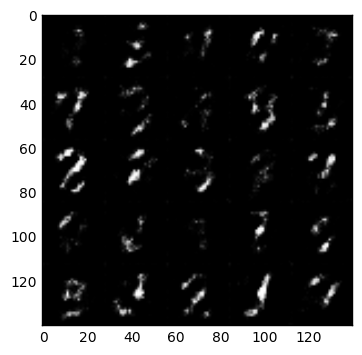

Epoch 1/2... Batch 250... Discriminator Loss: 1.5266... Generator Loss: 1.1495
Epoch 1/2... Batch 260... Discriminator Loss: 1.1505... Generator Loss: 0.9752


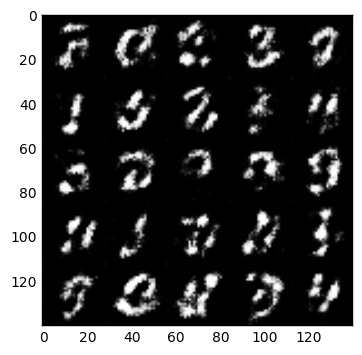

Epoch 1/2... Batch 270... Discriminator Loss: 1.4314... Generator Loss: 1.0065
Epoch 1/2... Batch 280... Discriminator Loss: 1.4240... Generator Loss: 0.7172


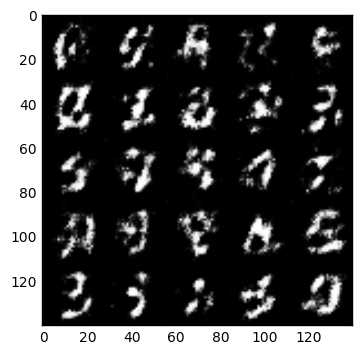

Epoch 1/2... Batch 290... Discriminator Loss: 1.4515... Generator Loss: 0.9619
Epoch 1/2... Batch 300... Discriminator Loss: 1.3881... Generator Loss: 1.2469


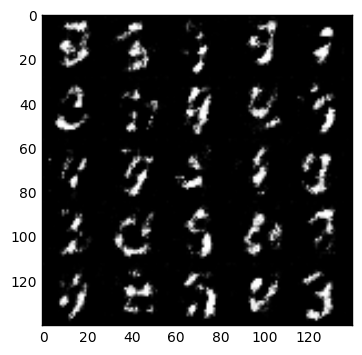

Epoch 1/2... Batch 310... Discriminator Loss: 1.4360... Generator Loss: 1.3172
Epoch 1/2... Batch 320... Discriminator Loss: 1.2552... Generator Loss: 1.0636


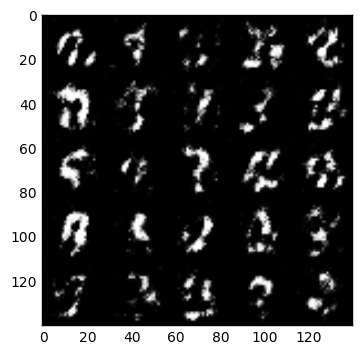

Epoch 1/2... Batch 330... Discriminator Loss: 1.3262... Generator Loss: 0.9574
Epoch 1/2... Batch 340... Discriminator Loss: 1.4438... Generator Loss: 0.7144


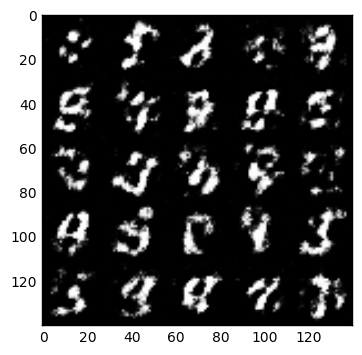

Epoch 1/2... Batch 350... Discriminator Loss: 1.4379... Generator Loss: 1.4362
Epoch 1/2... Batch 360... Discriminator Loss: 1.2039... Generator Loss: 1.2015


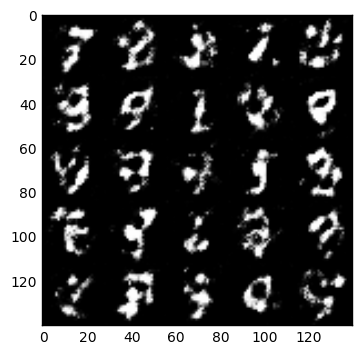

Epoch 1/2... Batch 370... Discriminator Loss: 1.5673... Generator Loss: 1.1784
Epoch 1/2... Batch 380... Discriminator Loss: 1.3418... Generator Loss: 0.9179


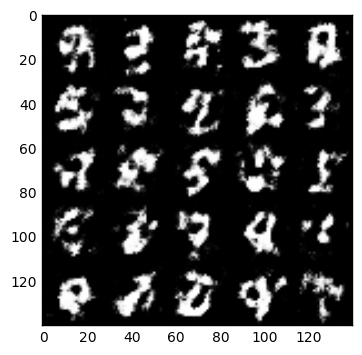

Epoch 1/2... Batch 390... Discriminator Loss: 1.4055... Generator Loss: 1.3454
Epoch 1/2... Batch 400... Discriminator Loss: 1.4216... Generator Loss: 1.0040


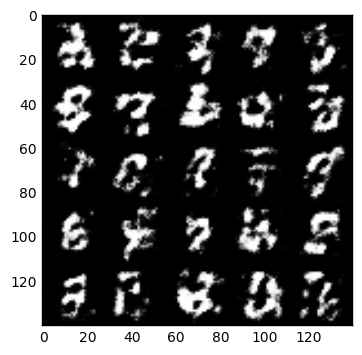

Epoch 1/2... Batch 410... Discriminator Loss: 1.4936... Generator Loss: 0.7578
Epoch 1/2... Batch 420... Discriminator Loss: 1.1491... Generator Loss: 1.4315


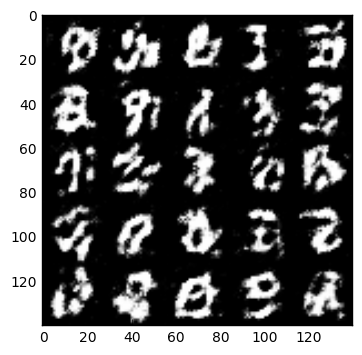

Epoch 1/2... Batch 430... Discriminator Loss: 1.2798... Generator Loss: 0.7945
Epoch 1/2... Batch 440... Discriminator Loss: 1.6081... Generator Loss: 0.6339


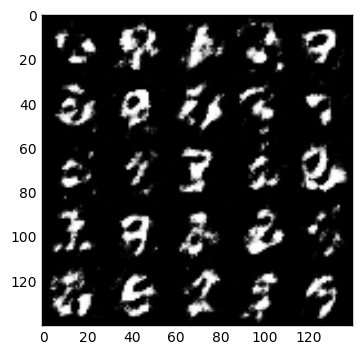

Epoch 1/2... Batch 450... Discriminator Loss: 1.0861... Generator Loss: 1.4592
Epoch 1/2... Batch 460... Discriminator Loss: 1.3866... Generator Loss: 1.2649


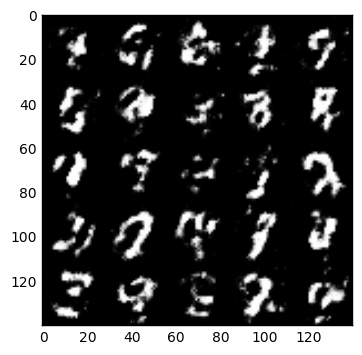

Epoch 1/2... Batch 470... Discriminator Loss: 1.1732... Generator Loss: 0.8011
Epoch 1/2... Batch 480... Discriminator Loss: 1.1366... Generator Loss: 1.0983


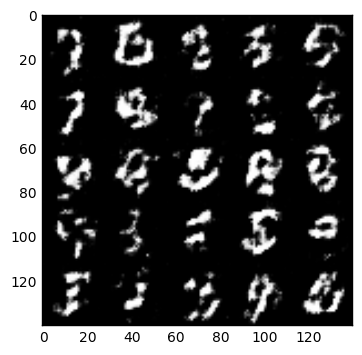

Epoch 1/2... Batch 490... Discriminator Loss: 1.4956... Generator Loss: 0.7451
Epoch 1/2... Batch 500... Discriminator Loss: 1.0509... Generator Loss: 0.8269


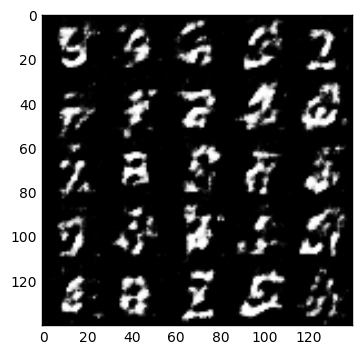

Epoch 1/2... Batch 510... Discriminator Loss: 1.2365... Generator Loss: 1.0396
Epoch 1/2... Batch 520... Discriminator Loss: 1.1671... Generator Loss: 1.5428


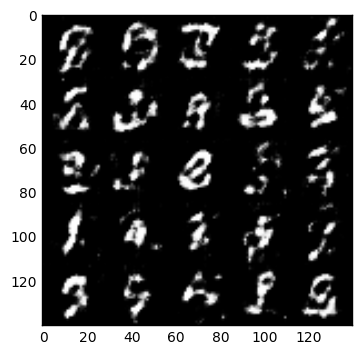

Epoch 1/2... Batch 530... Discriminator Loss: 1.0798... Generator Loss: 0.9435
Epoch 1/2... Batch 540... Discriminator Loss: 1.2024... Generator Loss: 1.4077


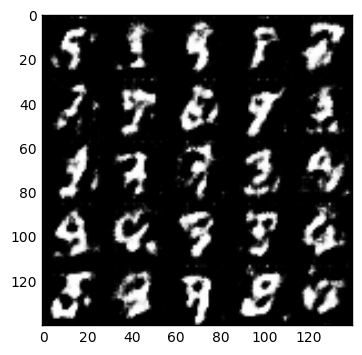

Epoch 1/2... Batch 550... Discriminator Loss: 1.3415... Generator Loss: 1.0728
Epoch 1/2... Batch 560... Discriminator Loss: 1.4005... Generator Loss: 0.9274


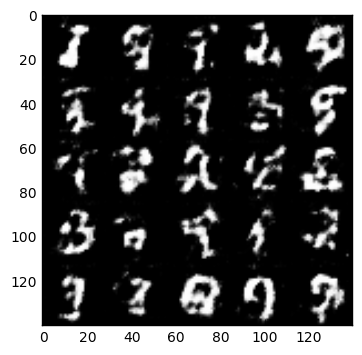

Epoch 1/2... Batch 570... Discriminator Loss: 1.1307... Generator Loss: 0.9479
Epoch 1/2... Batch 580... Discriminator Loss: 1.2754... Generator Loss: 0.8791


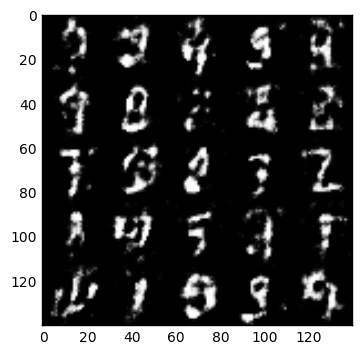

Epoch 1/2... Batch 590... Discriminator Loss: 1.0785... Generator Loss: 1.3779
Epoch 1/2... Batch 600... Discriminator Loss: 1.2906... Generator Loss: 1.4070


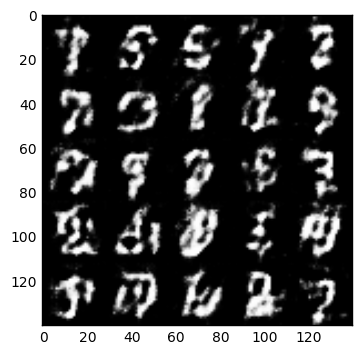

Epoch 1/2... Batch 610... Discriminator Loss: 1.2240... Generator Loss: 0.9363
Epoch 1/2... Batch 620... Discriminator Loss: 1.2585... Generator Loss: 1.5180


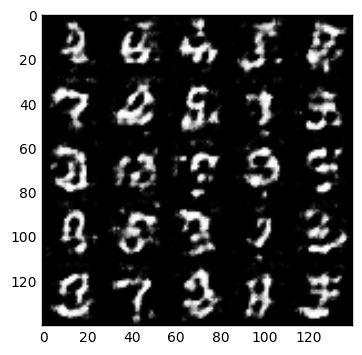

Epoch 1/2... Batch 630... Discriminator Loss: 1.3536... Generator Loss: 0.8178
Epoch 1/2... Batch 640... Discriminator Loss: 1.2647... Generator Loss: 1.1229


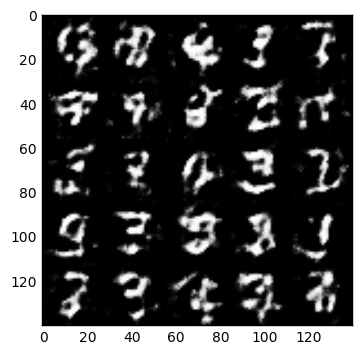

Epoch 1/2... Batch 650... Discriminator Loss: 1.4104... Generator Loss: 0.7093
Epoch 1/2... Batch 660... Discriminator Loss: 1.4241... Generator Loss: 0.9963


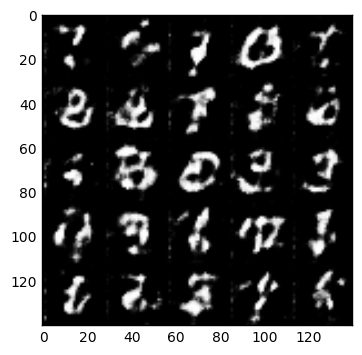

Epoch 1/2... Batch 670... Discriminator Loss: 1.2835... Generator Loss: 1.0383
Epoch 1/2... Batch 680... Discriminator Loss: 0.8763... Generator Loss: 1.1334


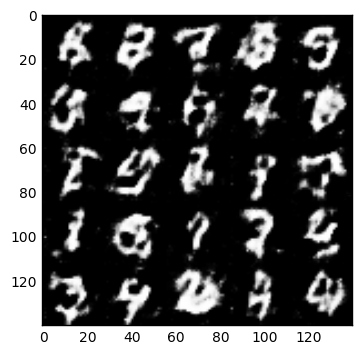

Epoch 1/2... Batch 690... Discriminator Loss: 1.2444... Generator Loss: 1.5702
Epoch 1/2... Batch 700... Discriminator Loss: 1.1650... Generator Loss: 1.1984


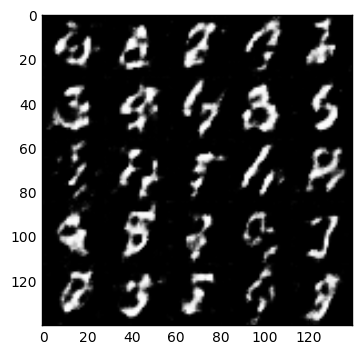

Epoch 1/2... Batch 710... Discriminator Loss: 1.3313... Generator Loss: 1.1926
Epoch 1/2... Batch 720... Discriminator Loss: 1.3586... Generator Loss: 0.7898


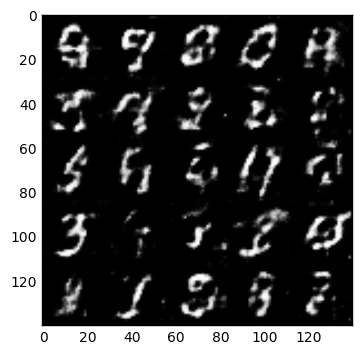

Epoch 1/2... Batch 730... Discriminator Loss: 1.0994... Generator Loss: 1.2622
Epoch 1/2... Batch 740... Discriminator Loss: 1.1359... Generator Loss: 0.9091


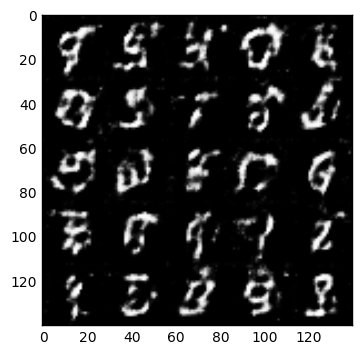

Epoch 1/2... Batch 750... Discriminator Loss: 1.2650... Generator Loss: 1.2494
Epoch 1/2... Batch 760... Discriminator Loss: 1.0211... Generator Loss: 1.6593


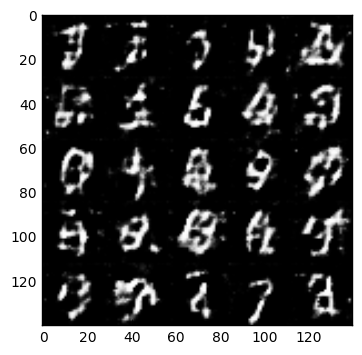

Epoch 1/2... Batch 770... Discriminator Loss: 1.4999... Generator Loss: 0.7618
Epoch 1/2... Batch 780... Discriminator Loss: 1.2782... Generator Loss: 0.9060


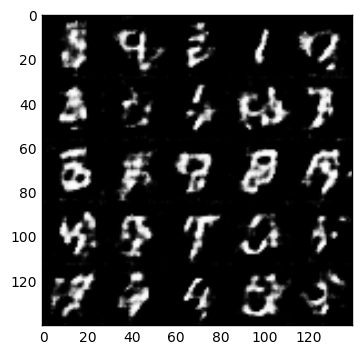

Epoch 1/2... Batch 790... Discriminator Loss: 1.3541... Generator Loss: 0.9513
Epoch 1/2... Batch 800... Discriminator Loss: 1.3426... Generator Loss: 0.8303


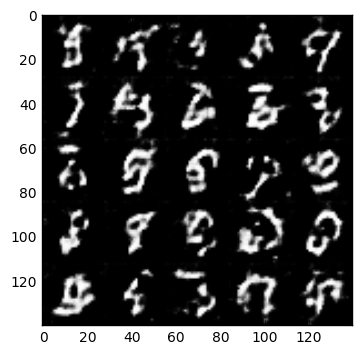

Epoch 1/2... Batch 810... Discriminator Loss: 1.4107... Generator Loss: 0.7983
Epoch 1/2... Batch 820... Discriminator Loss: 1.4606... Generator Loss: 1.1984


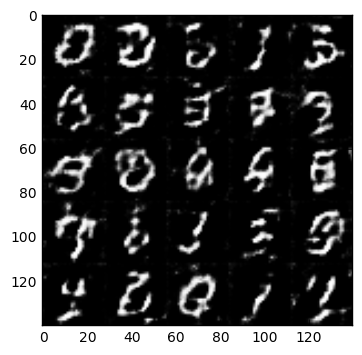

Epoch 1/2... Batch 830... Discriminator Loss: 1.2943... Generator Loss: 0.6288
Epoch 1/2... Batch 840... Discriminator Loss: 1.1344... Generator Loss: 1.2658


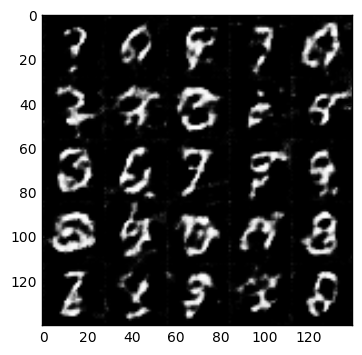

Epoch 1/2... Batch 850... Discriminator Loss: 1.3189... Generator Loss: 0.8507
Epoch 1/2... Batch 860... Discriminator Loss: 1.3635... Generator Loss: 1.2218


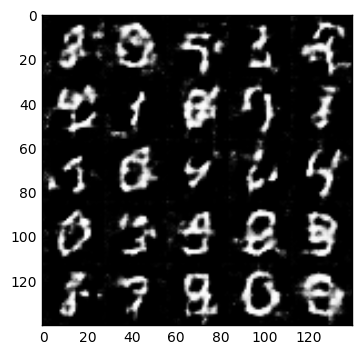

Epoch 1/2... Batch 870... Discriminator Loss: 1.3771... Generator Loss: 0.7867
Epoch 1/2... Batch 880... Discriminator Loss: 1.3311... Generator Loss: 0.6986


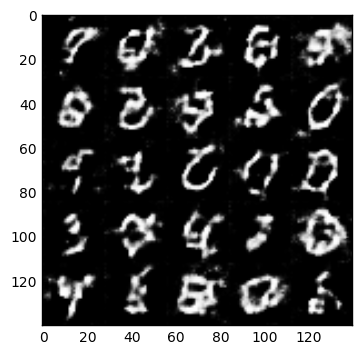

Epoch 1/2... Batch 890... Discriminator Loss: 1.3691... Generator Loss: 0.9869
Epoch 1/2... Batch 900... Discriminator Loss: 1.2437... Generator Loss: 0.8463


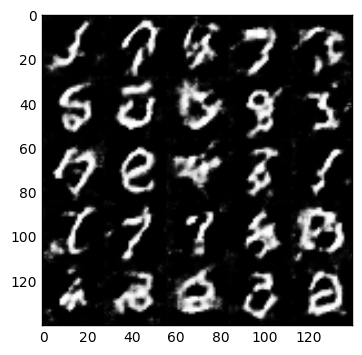

Epoch 1/2... Batch 910... Discriminator Loss: 1.1633... Generator Loss: 1.0756
Epoch 1/2... Batch 920... Discriminator Loss: 1.1643... Generator Loss: 1.0341


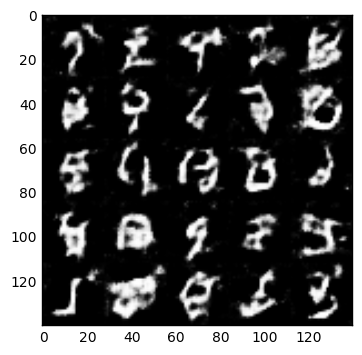

Epoch 1/2... Batch 930... Discriminator Loss: 1.3833... Generator Loss: 1.6072
Epoch 1/2... Batch 940... Discriminator Loss: 1.4501... Generator Loss: 0.8608


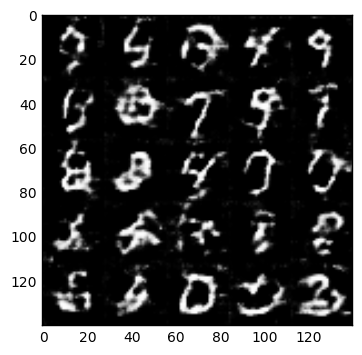

Epoch 1/2... Batch 950... Discriminator Loss: 1.0866... Generator Loss: 1.1628
Epoch 1/2... Batch 960... Discriminator Loss: 1.3658... Generator Loss: 1.0293


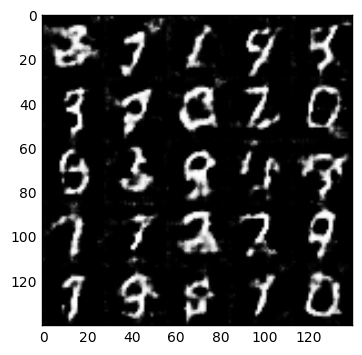

Epoch 1/2... Batch 970... Discriminator Loss: 1.3050... Generator Loss: 1.1978
Epoch 1/2... Batch 980... Discriminator Loss: 1.4211... Generator Loss: 1.6061


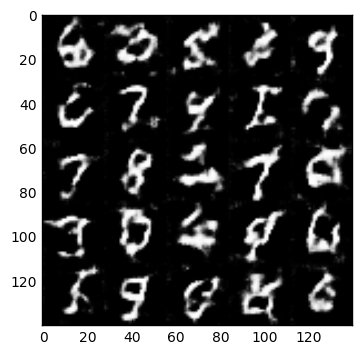

Epoch 1/2... Batch 990... Discriminator Loss: 1.1431... Generator Loss: 1.2235
Epoch 1/2... Batch 1000... Discriminator Loss: 1.4212... Generator Loss: 0.9060


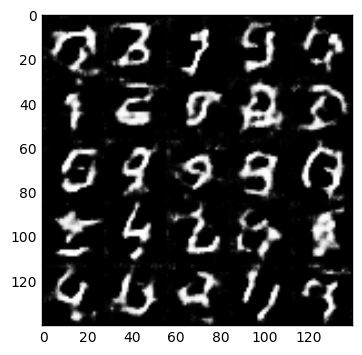

Epoch 1/2... Batch 1010... Discriminator Loss: 1.3280... Generator Loss: 1.9596
Epoch 1/2... Batch 1020... Discriminator Loss: 1.3603... Generator Loss: 0.8440


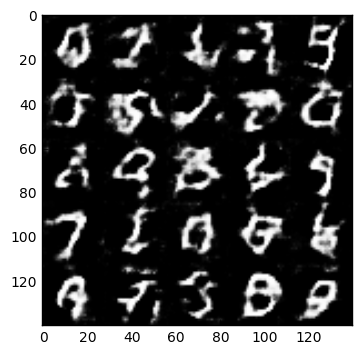

Epoch 1/2... Batch 1030... Discriminator Loss: 1.3283... Generator Loss: 0.8912
Epoch 1/2... Batch 1040... Discriminator Loss: 1.2099... Generator Loss: 0.8291


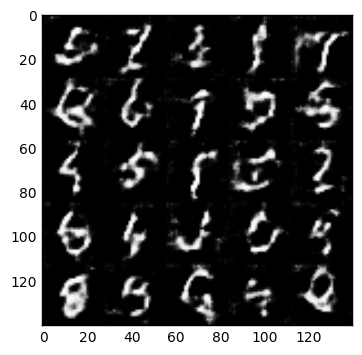

Epoch 1/2... Batch 1050... Discriminator Loss: 1.1339... Generator Loss: 1.1789
Epoch 1/2... Batch 1060... Discriminator Loss: 1.3436... Generator Loss: 1.1548


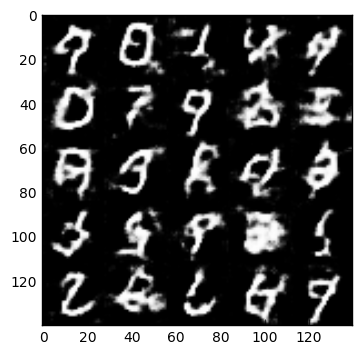

Epoch 1/2... Batch 1070... Discriminator Loss: 1.2523... Generator Loss: 1.1735
Epoch 1/2... Batch 1080... Discriminator Loss: 1.1196... Generator Loss: 1.0943


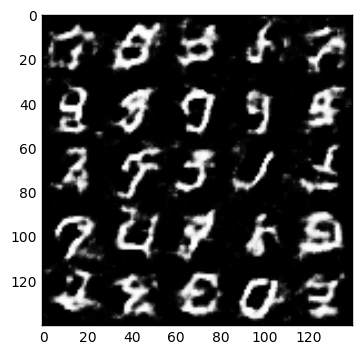

Epoch 1/2... Batch 1090... Discriminator Loss: 1.2296... Generator Loss: 0.9468
Epoch 1/2... Batch 1100... Discriminator Loss: 1.4695... Generator Loss: 0.6237


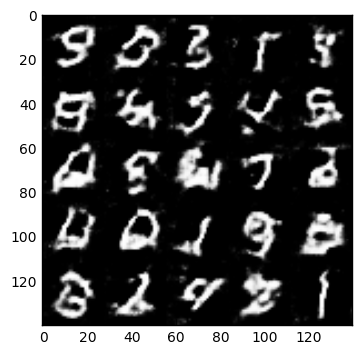

Epoch 1/2... Batch 1110... Discriminator Loss: 1.3704... Generator Loss: 1.0821
Epoch 1/2... Batch 1120... Discriminator Loss: 1.5575... Generator Loss: 1.0415


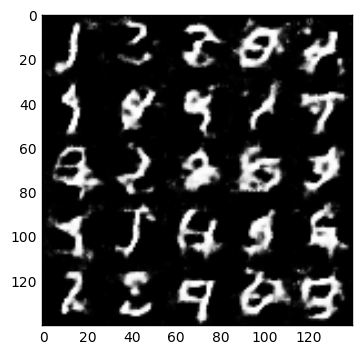

Epoch 1/2... Batch 1130... Discriminator Loss: 1.3349... Generator Loss: 1.2930
Epoch 1/2... Batch 1140... Discriminator Loss: 1.1658... Generator Loss: 0.9626


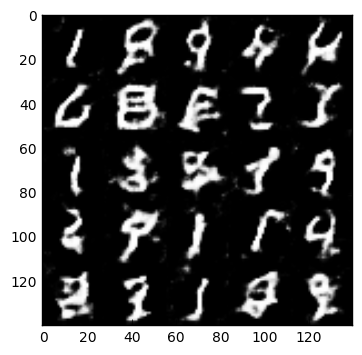

Epoch 1/2... Batch 1150... Discriminator Loss: 1.3341... Generator Loss: 0.6977
Epoch 1/2... Batch 1160... Discriminator Loss: 1.2594... Generator Loss: 1.2119


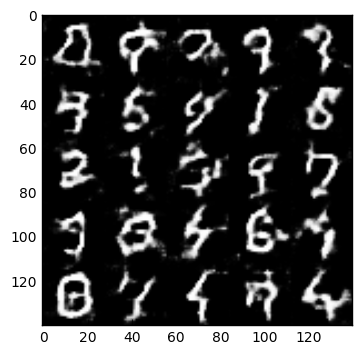

Epoch 1/2... Batch 1170... Discriminator Loss: 1.1908... Generator Loss: 1.0138
Epoch 1/2... Batch 1180... Discriminator Loss: 1.3236... Generator Loss: 0.7954


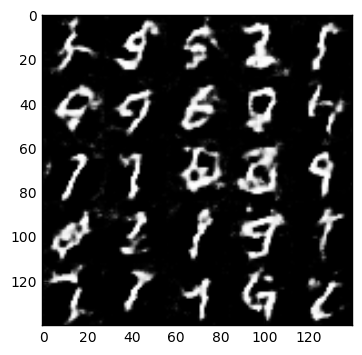

Epoch 1/2... Batch 1190... Discriminator Loss: 1.2402... Generator Loss: 0.9403
Epoch 1/2... Batch 1200... Discriminator Loss: 1.2493... Generator Loss: 1.0896


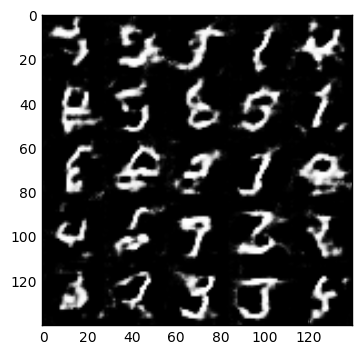

Epoch 1/2... Batch 1210... Discriminator Loss: 1.3705... Generator Loss: 0.7856
Epoch 1/2... Batch 1220... Discriminator Loss: 1.5355... Generator Loss: 0.6173


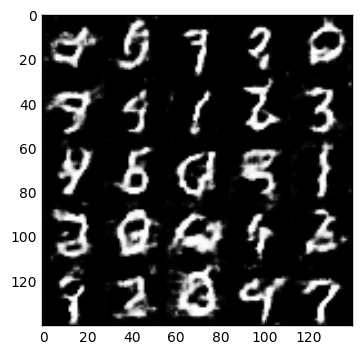

Epoch 1/2... Batch 1230... Discriminator Loss: 1.2520... Generator Loss: 0.8377
Epoch 1/2... Batch 1240... Discriminator Loss: 1.4070... Generator Loss: 0.8952


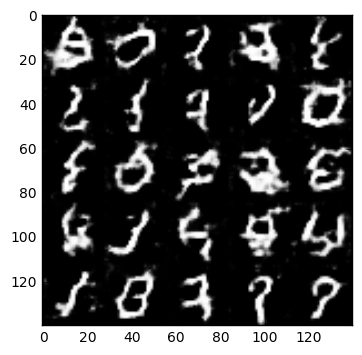

Epoch 1/2... Batch 1250... Discriminator Loss: 1.4486... Generator Loss: 1.4515
Epoch 1/2... Batch 1260... Discriminator Loss: 1.4561... Generator Loss: 1.5576


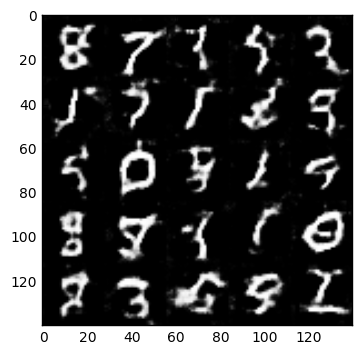

Epoch 1/2... Batch 1270... Discriminator Loss: 1.3455... Generator Loss: 0.8116
Epoch 1/2... Batch 1280... Discriminator Loss: 1.1813... Generator Loss: 1.3164


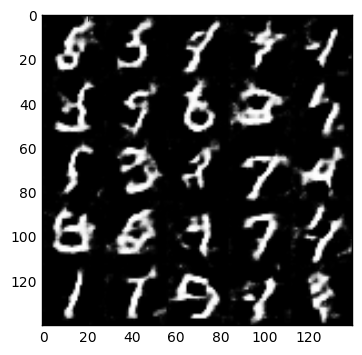

Epoch 1/2... Batch 1290... Discriminator Loss: 1.2695... Generator Loss: 0.9942
Epoch 1/2... Batch 1300... Discriminator Loss: 1.2719... Generator Loss: 0.8762


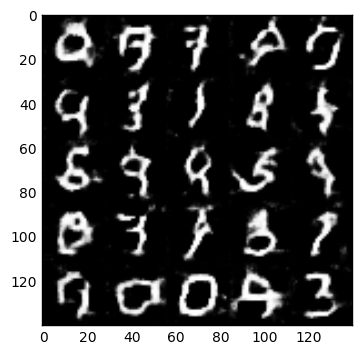

Epoch 1/2... Batch 1310... Discriminator Loss: 1.1733... Generator Loss: 1.1274
Epoch 1/2... Batch 1320... Discriminator Loss: 1.3158... Generator Loss: 0.6008


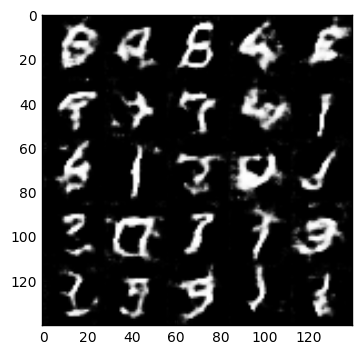

Epoch 1/2... Batch 1330... Discriminator Loss: 1.4709... Generator Loss: 0.8254
Epoch 1/2... Batch 1340... Discriminator Loss: 1.4702... Generator Loss: 0.9937


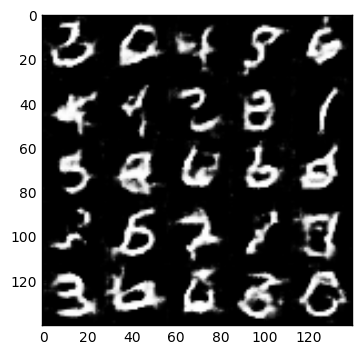

Epoch 1/2... Batch 1350... Discriminator Loss: 1.4041... Generator Loss: 0.7978
Epoch 1/2... Batch 1360... Discriminator Loss: 1.3745... Generator Loss: 1.1388


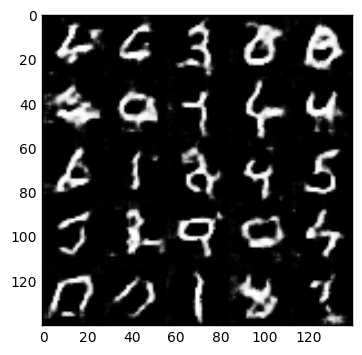

Epoch 1/2... Batch 1370... Discriminator Loss: 1.2813... Generator Loss: 0.8433
Epoch 1/2... Batch 1380... Discriminator Loss: 1.3280... Generator Loss: 1.0733


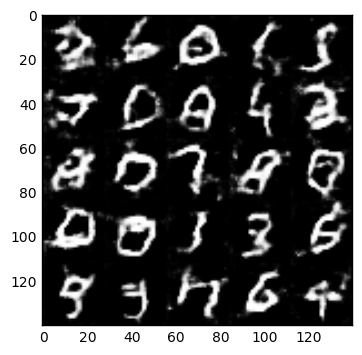

Epoch 1/2... Batch 1390... Discriminator Loss: 1.1884... Generator Loss: 1.0558
Epoch 1/2... Batch 1400... Discriminator Loss: 1.2523... Generator Loss: 0.8042


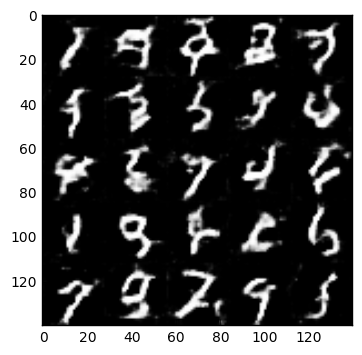

Epoch 1/2... Batch 1410... Discriminator Loss: 1.2410... Generator Loss: 1.0118
Epoch 1/2... Batch 1420... Discriminator Loss: 1.3302... Generator Loss: 0.9360


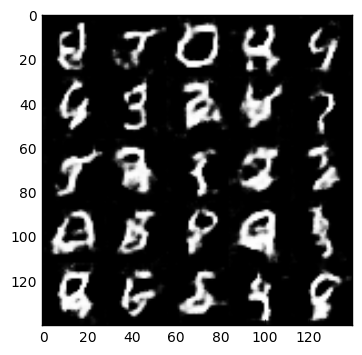

Epoch 1/2... Batch 1430... Discriminator Loss: 1.5549... Generator Loss: 0.5842
Epoch 1/2... Batch 1440... Discriminator Loss: 1.2026... Generator Loss: 0.9266


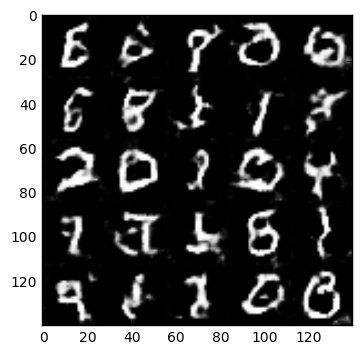

Epoch 1/2... Batch 1450... Discriminator Loss: 1.2548... Generator Loss: 1.1079
Epoch 1/2... Batch 1460... Discriminator Loss: 1.4642... Generator Loss: 0.6937


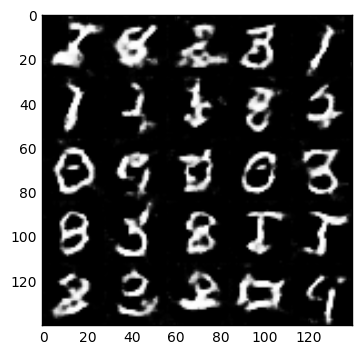

Epoch 1/2... Batch 1470... Discriminator Loss: 1.2774... Generator Loss: 1.2929
Epoch 1/2... Batch 1480... Discriminator Loss: 1.2063... Generator Loss: 0.7369


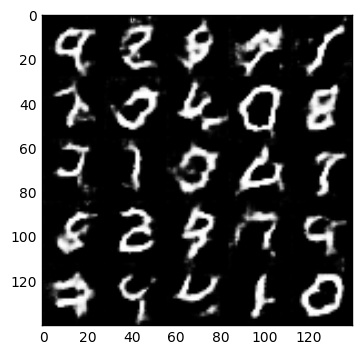

Epoch 1/2... Batch 1490... Discriminator Loss: 1.4857... Generator Loss: 0.7904
Epoch 1/2... Batch 1500... Discriminator Loss: 1.1692... Generator Loss: 0.9901


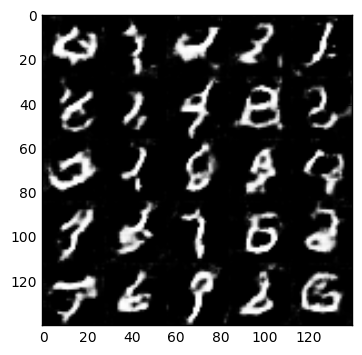

Epoch 1/2... Batch 1510... Discriminator Loss: 1.2361... Generator Loss: 1.3823
Epoch 1/2... Batch 1520... Discriminator Loss: 1.1203... Generator Loss: 1.1466


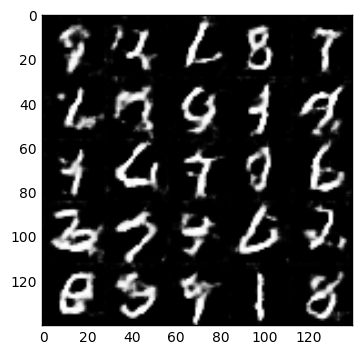

Epoch 1/2... Batch 1530... Discriminator Loss: 1.2161... Generator Loss: 1.2259
Epoch 1/2... Batch 1540... Discriminator Loss: 1.1477... Generator Loss: 1.0525


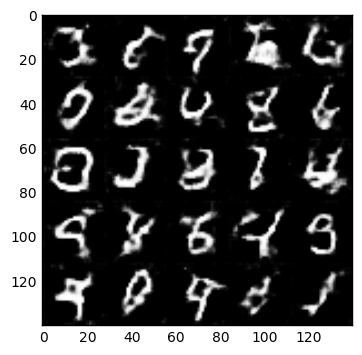

Epoch 1/2... Batch 1550... Discriminator Loss: 1.1757... Generator Loss: 1.0984
Epoch 1/2... Batch 1560... Discriminator Loss: 1.1740... Generator Loss: 0.9580


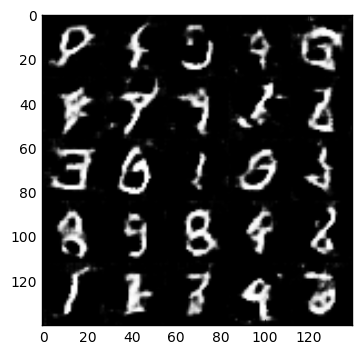

Epoch 1/2... Batch 1570... Discriminator Loss: 1.1957... Generator Loss: 0.6894
Epoch 1/2... Batch 1580... Discriminator Loss: 1.2749... Generator Loss: 0.8511


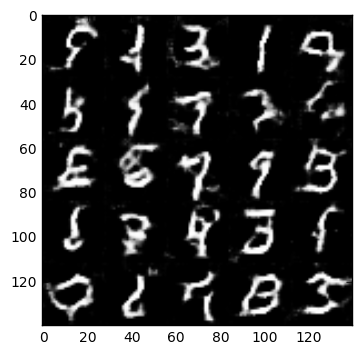

Epoch 1/2... Batch 1590... Discriminator Loss: 1.2674... Generator Loss: 0.8212
Epoch 1/2... Batch 1600... Discriminator Loss: 1.3428... Generator Loss: 1.1001


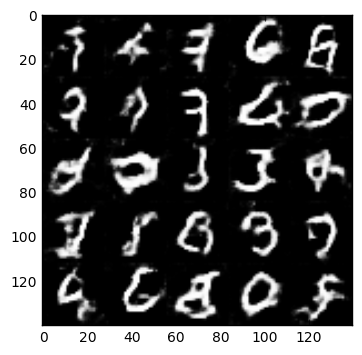

Epoch 1/2... Batch 1610... Discriminator Loss: 1.3572... Generator Loss: 0.9358
Epoch 1/2... Batch 1620... Discriminator Loss: 1.1392... Generator Loss: 1.0210


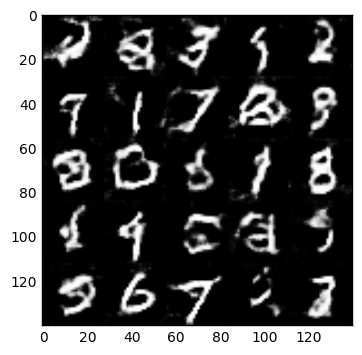

Epoch 1/2... Batch 1630... Discriminator Loss: 1.2255... Generator Loss: 1.2264
Epoch 1/2... Batch 1640... Discriminator Loss: 1.2222... Generator Loss: 1.3961


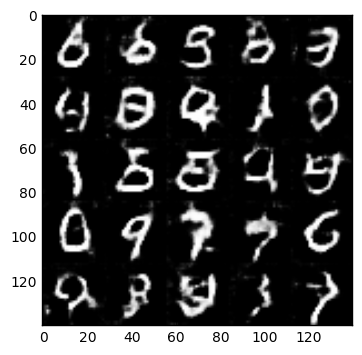

Epoch 1/2... Batch 1650... Discriminator Loss: 1.3715... Generator Loss: 1.0451
Epoch 1/2... Batch 1660... Discriminator Loss: 1.3369... Generator Loss: 0.9442


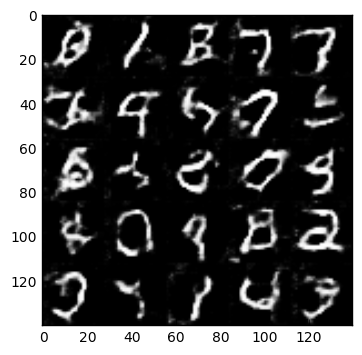

Epoch 1/2... Batch 1670... Discriminator Loss: 1.2323... Generator Loss: 1.1535
Epoch 1/2... Batch 1680... Discriminator Loss: 1.1402... Generator Loss: 1.1381


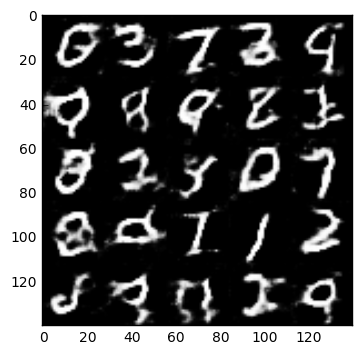

Epoch 1/2... Batch 1690... Discriminator Loss: 1.1817... Generator Loss: 1.7451
Epoch 1/2... Batch 1700... Discriminator Loss: 1.5084... Generator Loss: 0.6660


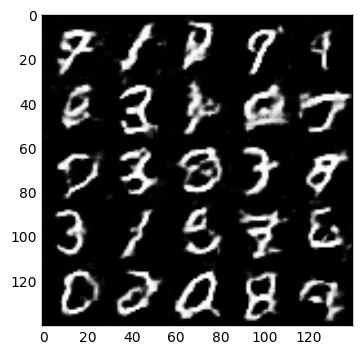

Epoch 1/2... Batch 1710... Discriminator Loss: 1.2408... Generator Loss: 1.4108
Epoch 1/2... Batch 1720... Discriminator Loss: 1.1988... Generator Loss: 0.9848


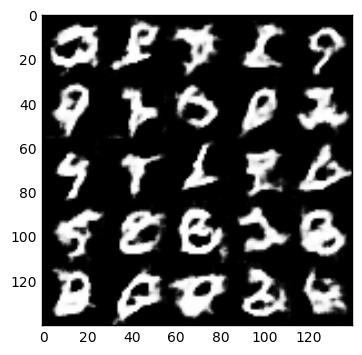

Epoch 1/2... Batch 1730... Discriminator Loss: 1.4429... Generator Loss: 1.1975
Epoch 1/2... Batch 1740... Discriminator Loss: 1.2929... Generator Loss: 0.8562


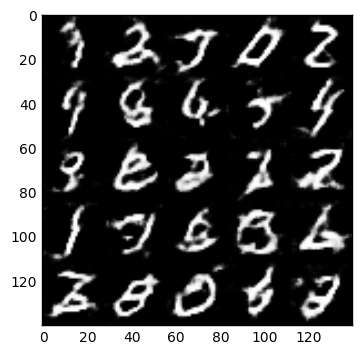

Epoch 1/2... Batch 1750... Discriminator Loss: 1.2151... Generator Loss: 1.2477
Epoch 1/2... Batch 1760... Discriminator Loss: 1.2672... Generator Loss: 1.2608


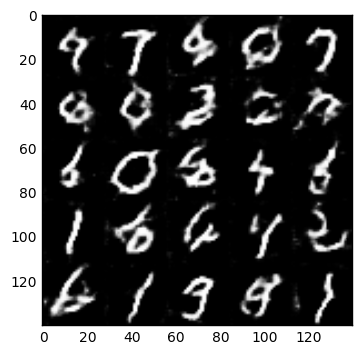

Epoch 1/2... Batch 1770... Discriminator Loss: 1.2116... Generator Loss: 1.0450
Epoch 1/2... Batch 1780... Discriminator Loss: 1.1490... Generator Loss: 0.9571


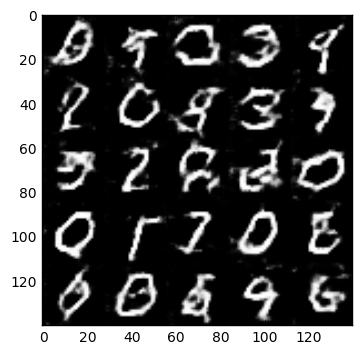

Epoch 1/2... Batch 1790... Discriminator Loss: 1.2078... Generator Loss: 0.9644
Epoch 1/2... Batch 1800... Discriminator Loss: 1.2946... Generator Loss: 1.1388


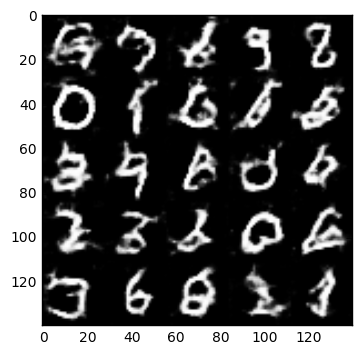

Epoch 1/2... Batch 1810... Discriminator Loss: 1.4795... Generator Loss: 0.8217
Epoch 1/2... Batch 1820... Discriminator Loss: 1.1475... Generator Loss: 1.0711


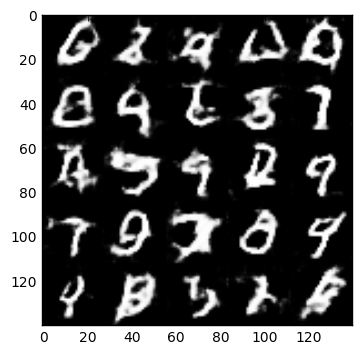

Epoch 1/2... Batch 1830... Discriminator Loss: 1.1602... Generator Loss: 0.8238
Epoch 1/2... Batch 1840... Discriminator Loss: 1.1776... Generator Loss: 1.0050


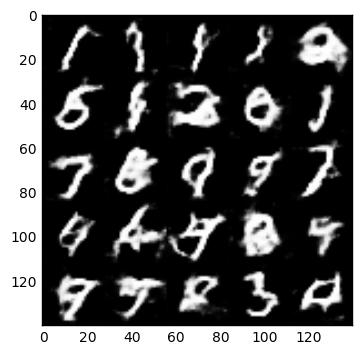

Epoch 1/2... Batch 1850... Discriminator Loss: 1.2951... Generator Loss: 0.9178
Epoch 1/2... Batch 1860... Discriminator Loss: 1.3298... Generator Loss: 0.7682


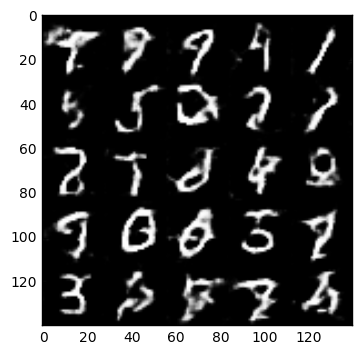

Epoch 1/2... Batch 1870... Discriminator Loss: 1.2413... Generator Loss: 1.0731
Epoch 2/2... Batch 10... Discriminator Loss: 1.2320... Generator Loss: 1.1269
Epoch 2/2... Batch 20... Discriminator Loss: 1.3124... Generator Loss: 1.0850


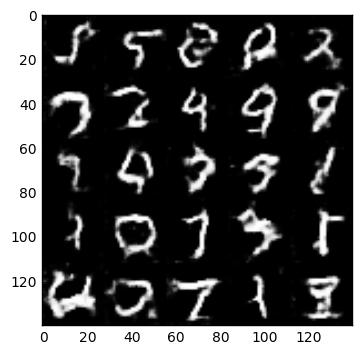

Epoch 2/2... Batch 30... Discriminator Loss: 1.3516... Generator Loss: 0.9129
Epoch 2/2... Batch 40... Discriminator Loss: 1.2478... Generator Loss: 1.1567


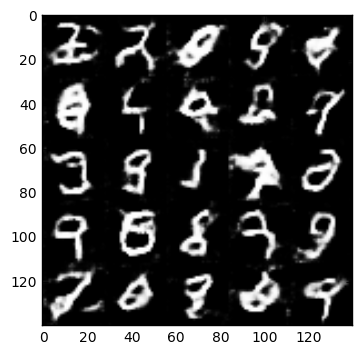

Epoch 2/2... Batch 50... Discriminator Loss: 1.2235... Generator Loss: 1.2458
Epoch 2/2... Batch 60... Discriminator Loss: 1.3743... Generator Loss: 0.7702


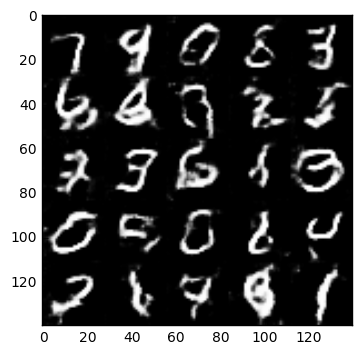

Epoch 2/2... Batch 70... Discriminator Loss: 1.1982... Generator Loss: 1.1057
Epoch 2/2... Batch 80... Discriminator Loss: 1.1351... Generator Loss: 1.1388


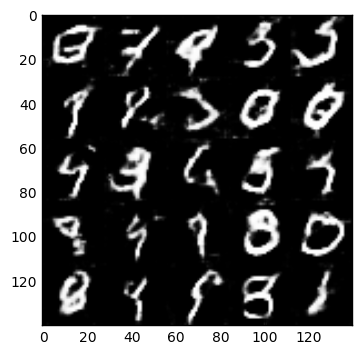

Epoch 2/2... Batch 90... Discriminator Loss: 1.1981... Generator Loss: 0.9480
Epoch 2/2... Batch 100... Discriminator Loss: 1.3386... Generator Loss: 0.7869


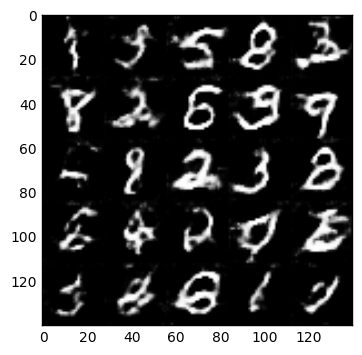

Epoch 2/2... Batch 110... Discriminator Loss: 1.2228... Generator Loss: 0.8695
Epoch 2/2... Batch 120... Discriminator Loss: 1.2962... Generator Loss: 1.1443


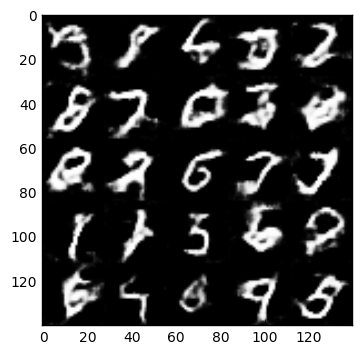

Epoch 2/2... Batch 130... Discriminator Loss: 1.4226... Generator Loss: 0.8097
Epoch 2/2... Batch 140... Discriminator Loss: 1.3588... Generator Loss: 1.0363


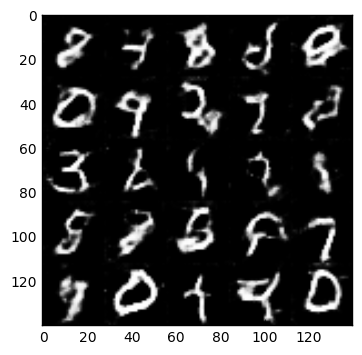

Epoch 2/2... Batch 150... Discriminator Loss: 1.2086... Generator Loss: 0.8829
Epoch 2/2... Batch 160... Discriminator Loss: 1.3129... Generator Loss: 0.7808


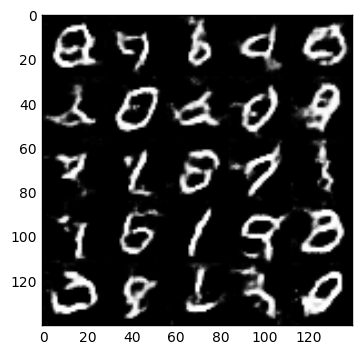

Epoch 2/2... Batch 170... Discriminator Loss: 1.2292... Generator Loss: 1.0338
Epoch 2/2... Batch 180... Discriminator Loss: 1.2440... Generator Loss: 1.2449


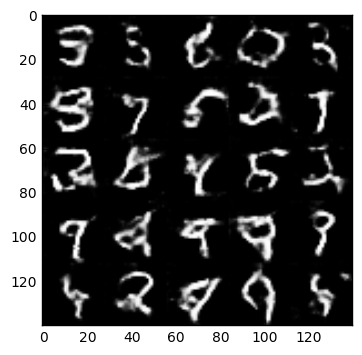

Epoch 2/2... Batch 190... Discriminator Loss: 1.2721... Generator Loss: 1.3682
Epoch 2/2... Batch 200... Discriminator Loss: 1.1621... Generator Loss: 1.1336


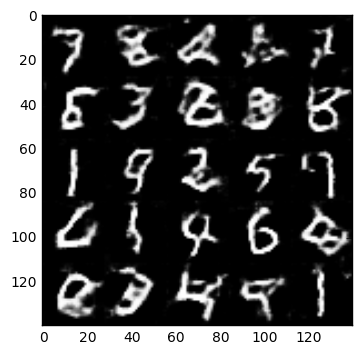

Epoch 2/2... Batch 210... Discriminator Loss: 1.3763... Generator Loss: 1.0369
Epoch 2/2... Batch 220... Discriminator Loss: 1.3009... Generator Loss: 1.1950


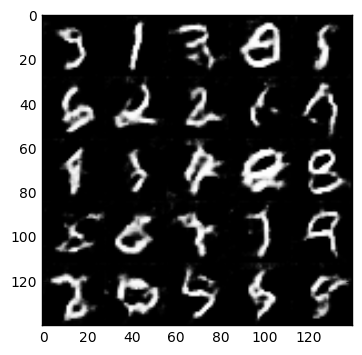

Epoch 2/2... Batch 230... Discriminator Loss: 1.2459... Generator Loss: 0.9139
Epoch 2/2... Batch 240... Discriminator Loss: 1.2821... Generator Loss: 1.3923


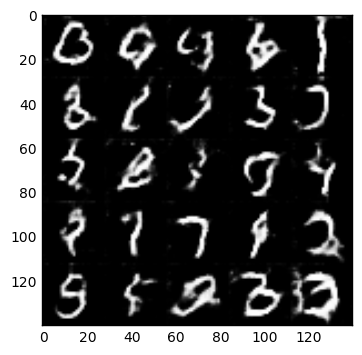

Epoch 2/2... Batch 250... Discriminator Loss: 1.3244... Generator Loss: 0.9416
Epoch 2/2... Batch 260... Discriminator Loss: 1.0777... Generator Loss: 1.0918


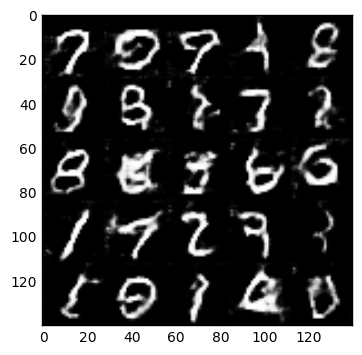

Epoch 2/2... Batch 270... Discriminator Loss: 1.3777... Generator Loss: 0.7312
Epoch 2/2... Batch 280... Discriminator Loss: 1.1944... Generator Loss: 0.9710


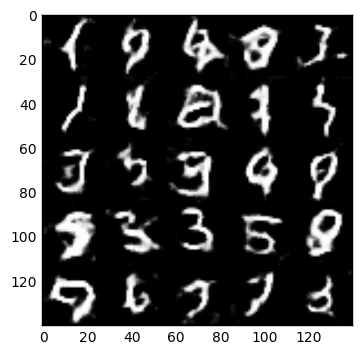

Epoch 2/2... Batch 290... Discriminator Loss: 1.5111... Generator Loss: 1.1786
Epoch 2/2... Batch 300... Discriminator Loss: 1.2552... Generator Loss: 0.8228


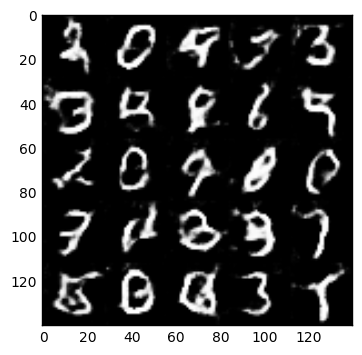

Epoch 2/2... Batch 310... Discriminator Loss: 1.1827... Generator Loss: 1.2942
Epoch 2/2... Batch 320... Discriminator Loss: 1.2619... Generator Loss: 1.2245


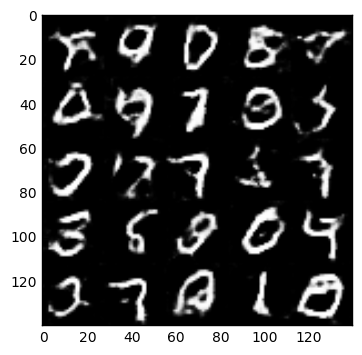

Epoch 2/2... Batch 330... Discriminator Loss: 1.2458... Generator Loss: 1.1376
Epoch 2/2... Batch 340... Discriminator Loss: 1.1893... Generator Loss: 0.7981


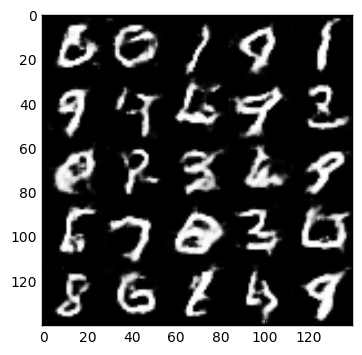

Epoch 2/2... Batch 350... Discriminator Loss: 1.1729... Generator Loss: 1.0654
Epoch 2/2... Batch 360... Discriminator Loss: 1.4065... Generator Loss: 0.7760


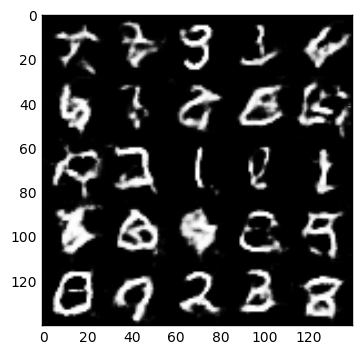

Epoch 2/2... Batch 370... Discriminator Loss: 1.2645... Generator Loss: 1.5359
Epoch 2/2... Batch 380... Discriminator Loss: 1.3256... Generator Loss: 0.6532


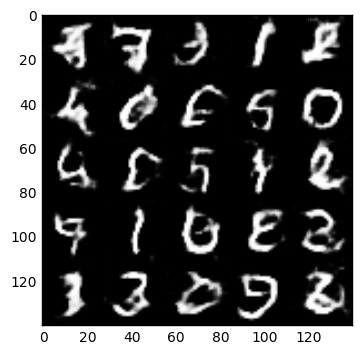

Epoch 2/2... Batch 390... Discriminator Loss: 1.5050... Generator Loss: 0.7160
Epoch 2/2... Batch 400... Discriminator Loss: 1.1519... Generator Loss: 0.8745


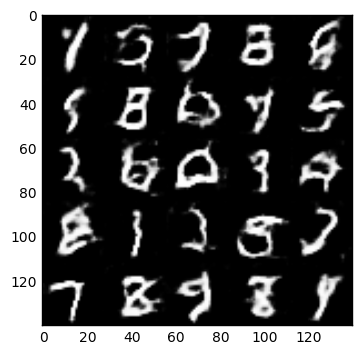

Epoch 2/2... Batch 410... Discriminator Loss: 1.1365... Generator Loss: 0.8045
Epoch 2/2... Batch 420... Discriminator Loss: 1.3644... Generator Loss: 0.8128


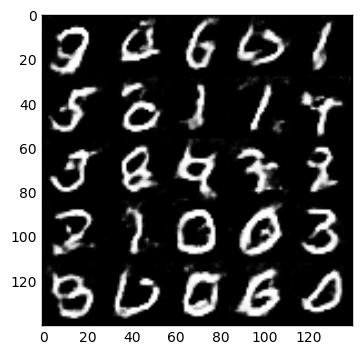

Epoch 2/2... Batch 430... Discriminator Loss: 1.2612... Generator Loss: 1.1005
Epoch 2/2... Batch 440... Discriminator Loss: 1.2443... Generator Loss: 0.9818


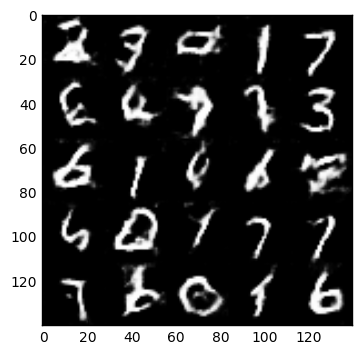

Epoch 2/2... Batch 450... Discriminator Loss: 1.1971... Generator Loss: 0.8938
Epoch 2/2... Batch 460... Discriminator Loss: 1.2890... Generator Loss: 0.9892


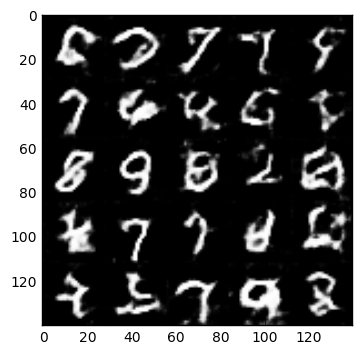

Epoch 2/2... Batch 470... Discriminator Loss: 1.1298... Generator Loss: 1.3675
Epoch 2/2... Batch 480... Discriminator Loss: 1.3704... Generator Loss: 0.7834


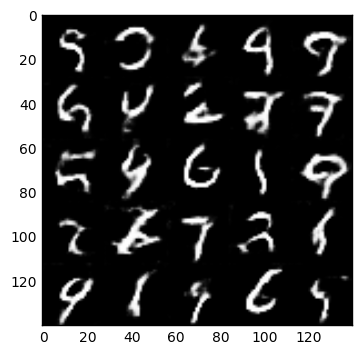

Epoch 2/2... Batch 490... Discriminator Loss: 1.3218... Generator Loss: 1.1809
Epoch 2/2... Batch 500... Discriminator Loss: 1.1664... Generator Loss: 0.7608


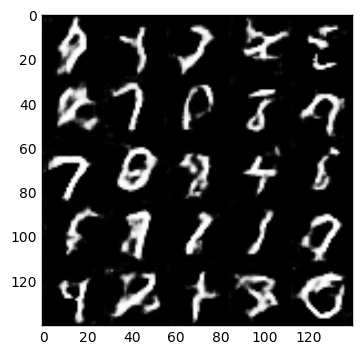

Epoch 2/2... Batch 510... Discriminator Loss: 1.2815... Generator Loss: 1.1460
Epoch 2/2... Batch 520... Discriminator Loss: 1.1630... Generator Loss: 0.8053


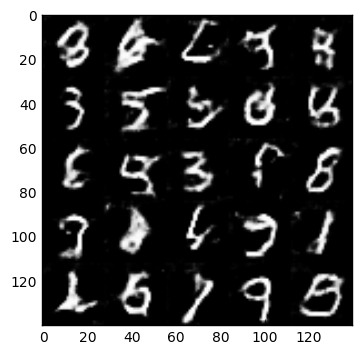

Epoch 2/2... Batch 530... Discriminator Loss: 1.1500... Generator Loss: 0.8130
Epoch 2/2... Batch 540... Discriminator Loss: 1.3672... Generator Loss: 1.0324


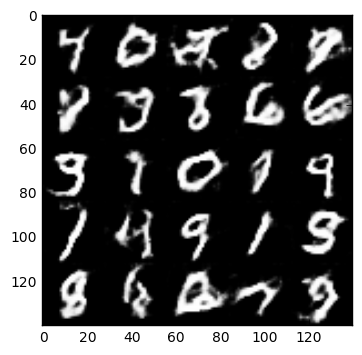

Epoch 2/2... Batch 550... Discriminator Loss: 1.1577... Generator Loss: 1.1631
Epoch 2/2... Batch 560... Discriminator Loss: 1.3906... Generator Loss: 0.9663


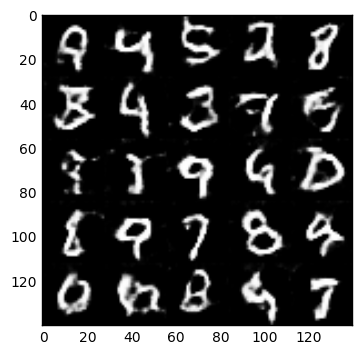

Epoch 2/2... Batch 570... Discriminator Loss: 1.2467... Generator Loss: 0.7066
Epoch 2/2... Batch 580... Discriminator Loss: 1.3668... Generator Loss: 0.8564


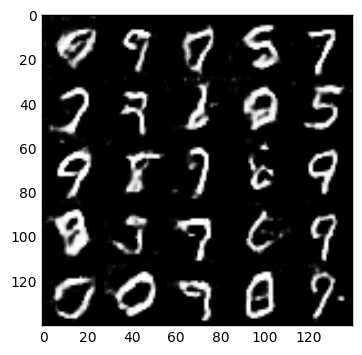

Epoch 2/2... Batch 590... Discriminator Loss: 1.1987... Generator Loss: 1.1319
Epoch 2/2... Batch 600... Discriminator Loss: 1.3057... Generator Loss: 1.0401


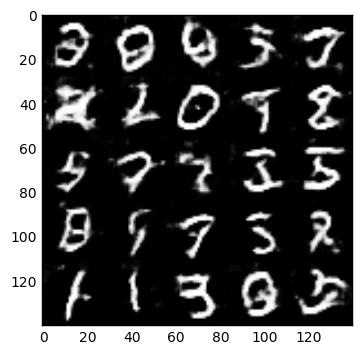

Epoch 2/2... Batch 610... Discriminator Loss: 1.4372... Generator Loss: 0.7495
Epoch 2/2... Batch 620... Discriminator Loss: 1.2811... Generator Loss: 0.7235


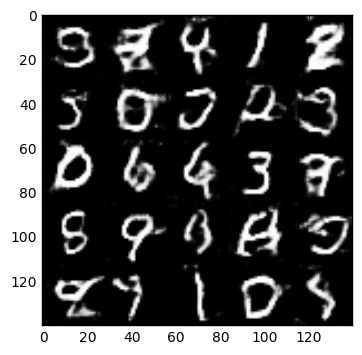

Epoch 2/2... Batch 630... Discriminator Loss: 1.3460... Generator Loss: 0.9401
Epoch 2/2... Batch 640... Discriminator Loss: 1.4227... Generator Loss: 0.9096


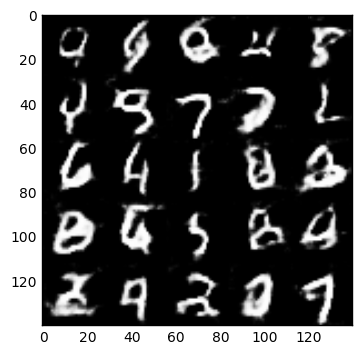

Epoch 2/2... Batch 650... Discriminator Loss: 1.2872... Generator Loss: 0.9489
Epoch 2/2... Batch 660... Discriminator Loss: 1.3372... Generator Loss: 1.1875


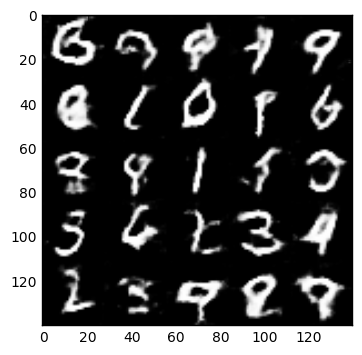

Epoch 2/2... Batch 670... Discriminator Loss: 1.3213... Generator Loss: 0.9675
Epoch 2/2... Batch 680... Discriminator Loss: 1.1950... Generator Loss: 1.0096


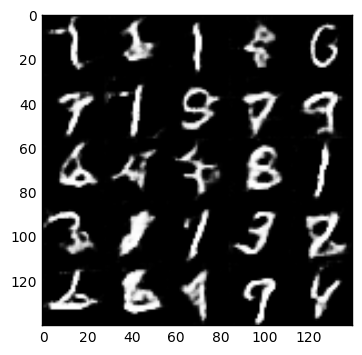

Epoch 2/2... Batch 690... Discriminator Loss: 1.3491... Generator Loss: 1.4139
Epoch 2/2... Batch 700... Discriminator Loss: 1.0455... Generator Loss: 0.9791


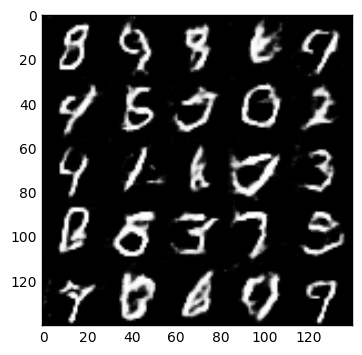

Epoch 2/2... Batch 710... Discriminator Loss: 1.3265... Generator Loss: 0.7517
Epoch 2/2... Batch 720... Discriminator Loss: 1.4485... Generator Loss: 0.8347


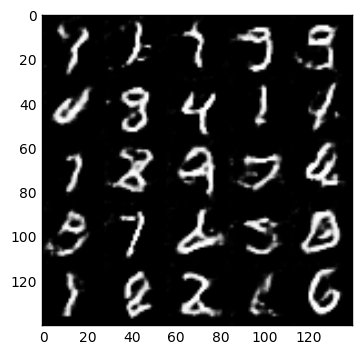

Epoch 2/2... Batch 730... Discriminator Loss: 1.2314... Generator Loss: 1.2889
Epoch 2/2... Batch 740... Discriminator Loss: 1.1631... Generator Loss: 1.0676


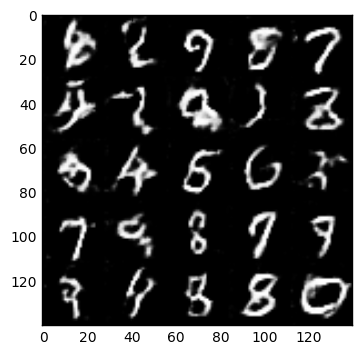

Epoch 2/2... Batch 750... Discriminator Loss: 1.2987... Generator Loss: 1.0536
Epoch 2/2... Batch 760... Discriminator Loss: 1.0568... Generator Loss: 1.1641


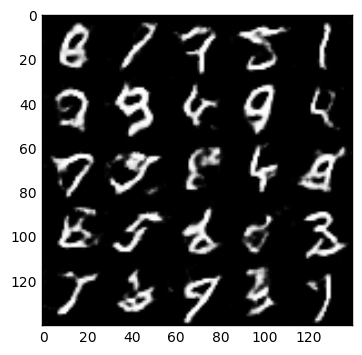

Epoch 2/2... Batch 770... Discriminator Loss: 1.2404... Generator Loss: 1.0799
Epoch 2/2... Batch 780... Discriminator Loss: 1.2193... Generator Loss: 0.9272


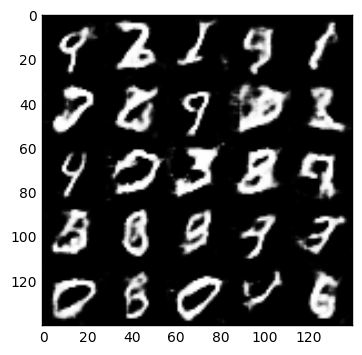

Epoch 2/2... Batch 790... Discriminator Loss: 1.2824... Generator Loss: 0.9558
Epoch 2/2... Batch 800... Discriminator Loss: 1.2991... Generator Loss: 0.9108


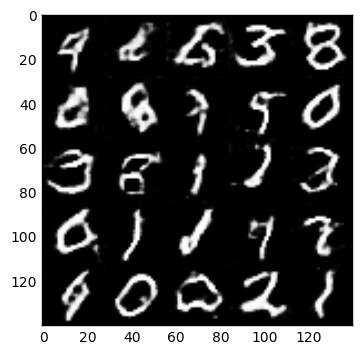

Epoch 2/2... Batch 810... Discriminator Loss: 1.2211... Generator Loss: 0.7690
Epoch 2/2... Batch 820... Discriminator Loss: 1.1921... Generator Loss: 1.0446


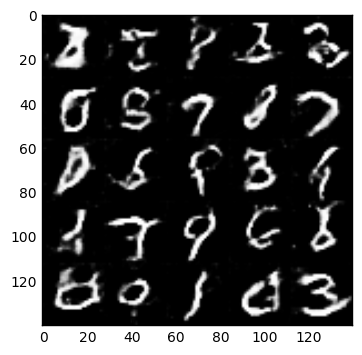

Epoch 2/2... Batch 830... Discriminator Loss: 1.3213... Generator Loss: 0.6751
Epoch 2/2... Batch 840... Discriminator Loss: 1.3630... Generator Loss: 0.7541


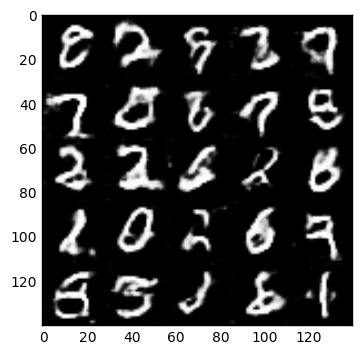

Epoch 2/2... Batch 850... Discriminator Loss: 1.1482... Generator Loss: 0.9053
Epoch 2/2... Batch 860... Discriminator Loss: 1.1626... Generator Loss: 1.2756


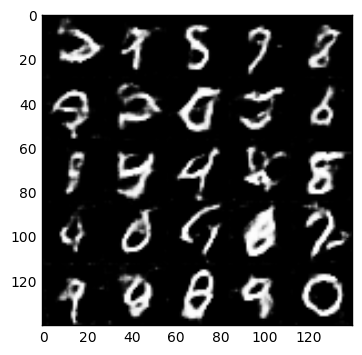

Epoch 2/2... Batch 870... Discriminator Loss: 1.2995... Generator Loss: 0.8755
Epoch 2/2... Batch 880... Discriminator Loss: 1.1464... Generator Loss: 0.9016


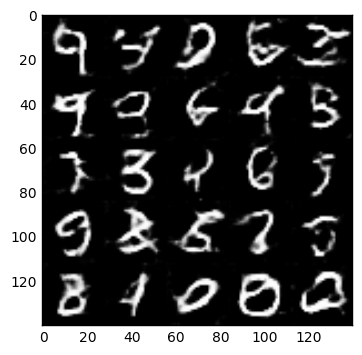

Epoch 2/2... Batch 890... Discriminator Loss: 1.1447... Generator Loss: 0.8001
Epoch 2/2... Batch 900... Discriminator Loss: 1.2356... Generator Loss: 1.3832


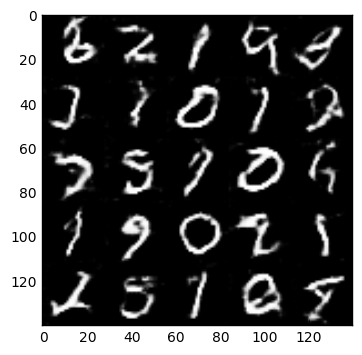

Epoch 2/2... Batch 910... Discriminator Loss: 1.2719... Generator Loss: 0.9520
Epoch 2/2... Batch 920... Discriminator Loss: 1.1789... Generator Loss: 1.0132


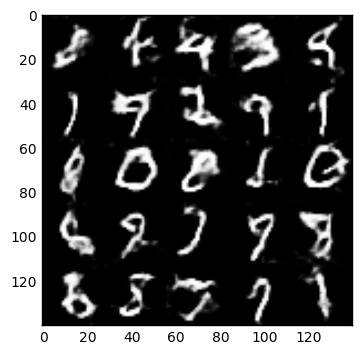

Epoch 2/2... Batch 930... Discriminator Loss: 1.4559... Generator Loss: 0.9862
Epoch 2/2... Batch 940... Discriminator Loss: 1.2183... Generator Loss: 0.7217


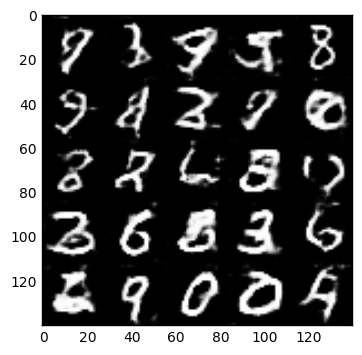

Epoch 2/2... Batch 950... Discriminator Loss: 1.4177... Generator Loss: 0.8839
Epoch 2/2... Batch 960... Discriminator Loss: 1.3239... Generator Loss: 0.9425


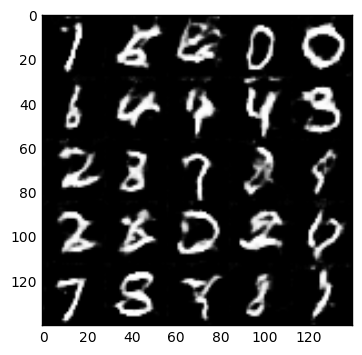

Epoch 2/2... Batch 970... Discriminator Loss: 1.3927... Generator Loss: 0.9660
Epoch 2/2... Batch 980... Discriminator Loss: 1.2378... Generator Loss: 1.2728


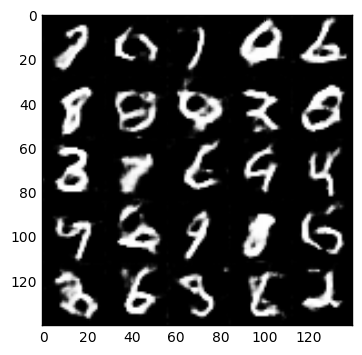

Epoch 2/2... Batch 990... Discriminator Loss: 1.2209... Generator Loss: 0.8487
Epoch 2/2... Batch 1000... Discriminator Loss: 1.1333... Generator Loss: 0.8969


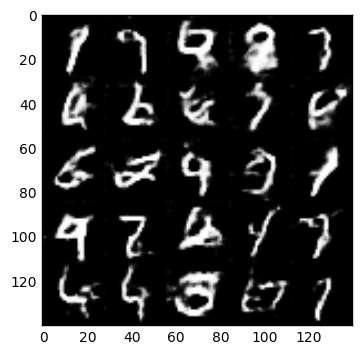

Epoch 2/2... Batch 1010... Discriminator Loss: 1.2838... Generator Loss: 0.8242
Epoch 2/2... Batch 1020... Discriminator Loss: 1.2844... Generator Loss: 0.8612


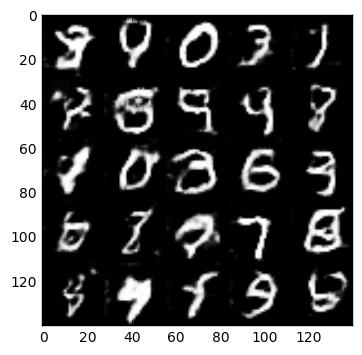

Epoch 2/2... Batch 1030... Discriminator Loss: 1.2051... Generator Loss: 1.2123
Epoch 2/2... Batch 1040... Discriminator Loss: 1.4369... Generator Loss: 1.3244


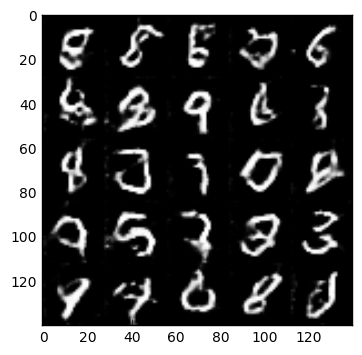

Epoch 2/2... Batch 1050... Discriminator Loss: 1.2757... Generator Loss: 1.1360
Epoch 2/2... Batch 1060... Discriminator Loss: 1.2811... Generator Loss: 0.9127


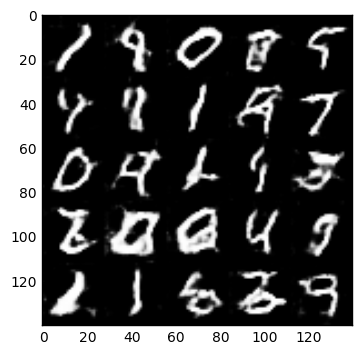

Epoch 2/2... Batch 1070... Discriminator Loss: 1.3322... Generator Loss: 0.6834
Epoch 2/2... Batch 1080... Discriminator Loss: 1.3093... Generator Loss: 0.9611


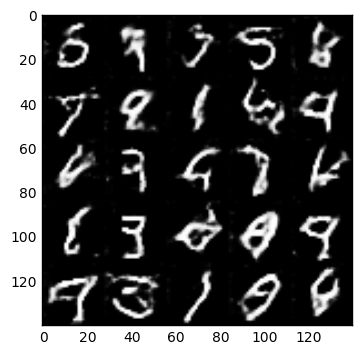

Epoch 2/2... Batch 1090... Discriminator Loss: 1.1272... Generator Loss: 0.9711
Epoch 2/2... Batch 1100... Discriminator Loss: 1.4717... Generator Loss: 0.6696


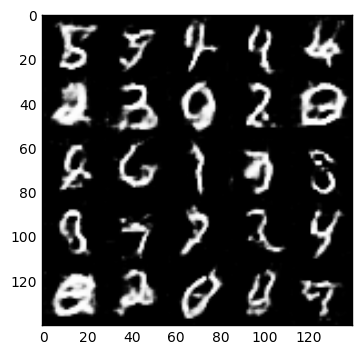

Epoch 2/2... Batch 1110... Discriminator Loss: 1.3112... Generator Loss: 0.9162
Epoch 2/2... Batch 1120... Discriminator Loss: 1.2120... Generator Loss: 0.9607


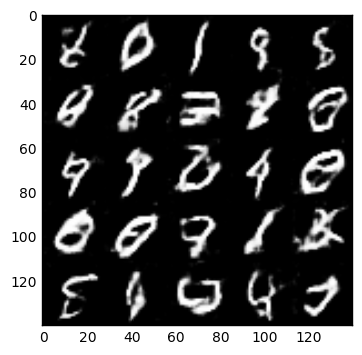

Epoch 2/2... Batch 1130... Discriminator Loss: 1.2740... Generator Loss: 0.9874
Epoch 2/2... Batch 1140... Discriminator Loss: 1.2754... Generator Loss: 0.7381


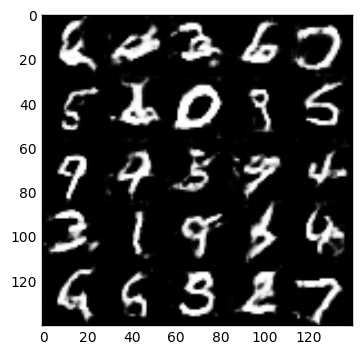

Epoch 2/2... Batch 1150... Discriminator Loss: 1.4767... Generator Loss: 0.9237
Epoch 2/2... Batch 1160... Discriminator Loss: 1.1867... Generator Loss: 1.0215


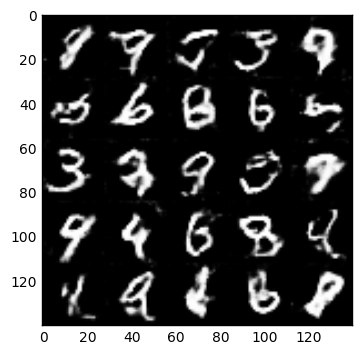

Epoch 2/2... Batch 1170... Discriminator Loss: 1.2747... Generator Loss: 0.9232
Epoch 2/2... Batch 1180... Discriminator Loss: 1.4515... Generator Loss: 1.2877


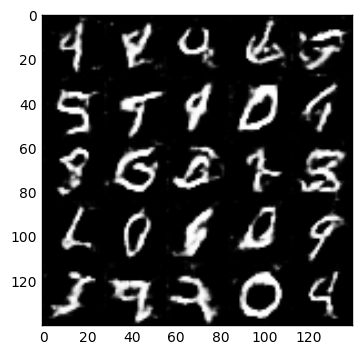

Epoch 2/2... Batch 1190... Discriminator Loss: 1.0938... Generator Loss: 1.0742
Epoch 2/2... Batch 1200... Discriminator Loss: 1.2360... Generator Loss: 0.7883


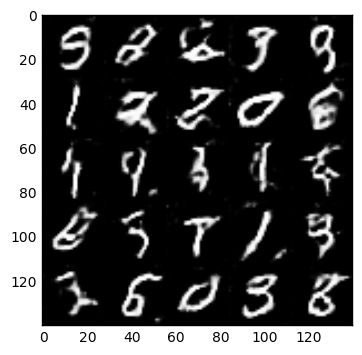

Epoch 2/2... Batch 1210... Discriminator Loss: 1.2158... Generator Loss: 1.0968
Epoch 2/2... Batch 1220... Discriminator Loss: 1.4168... Generator Loss: 0.7495


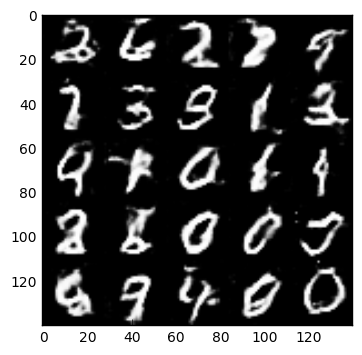

Epoch 2/2... Batch 1230... Discriminator Loss: 1.2913... Generator Loss: 0.8649
Epoch 2/2... Batch 1240... Discriminator Loss: 1.2560... Generator Loss: 0.8447


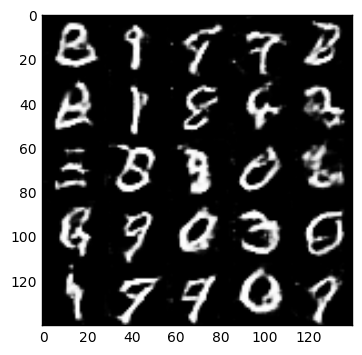

Epoch 2/2... Batch 1250... Discriminator Loss: 1.2233... Generator Loss: 0.8930
Epoch 2/2... Batch 1260... Discriminator Loss: 1.3479... Generator Loss: 0.9638


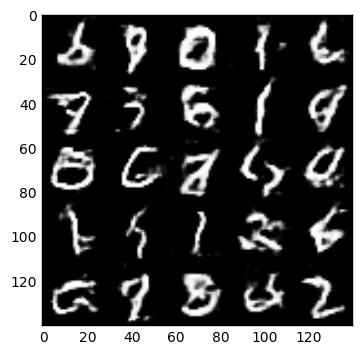

Epoch 2/2... Batch 1270... Discriminator Loss: 1.3084... Generator Loss: 1.0877
Epoch 2/2... Batch 1280... Discriminator Loss: 1.2392... Generator Loss: 0.9669


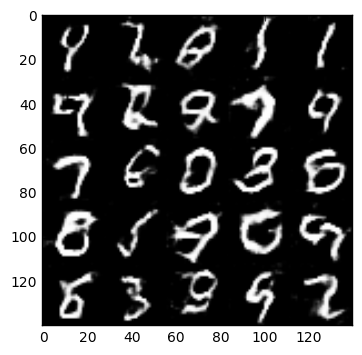

Epoch 2/2... Batch 1290... Discriminator Loss: 1.3809... Generator Loss: 1.0697
Epoch 2/2... Batch 1300... Discriminator Loss: 1.3461... Generator Loss: 0.8877


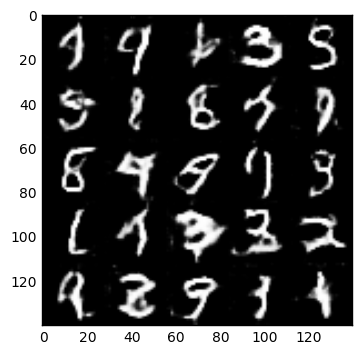

Epoch 2/2... Batch 1310... Discriminator Loss: 1.0566... Generator Loss: 1.4607
Epoch 2/2... Batch 1320... Discriminator Loss: 1.2919... Generator Loss: 0.7396


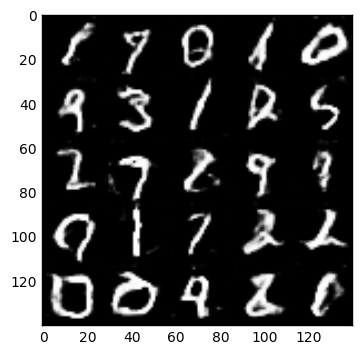

Epoch 2/2... Batch 1330... Discriminator Loss: 1.1949... Generator Loss: 0.9498
Epoch 2/2... Batch 1340... Discriminator Loss: 1.3237... Generator Loss: 0.8468


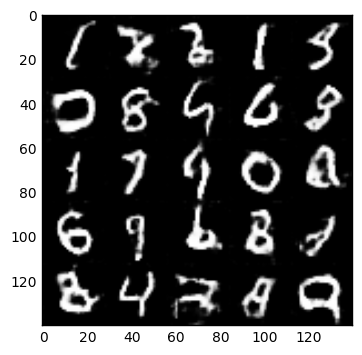

Epoch 2/2... Batch 1350... Discriminator Loss: 1.3121... Generator Loss: 1.0740
Epoch 2/2... Batch 1360... Discriminator Loss: 1.1850... Generator Loss: 1.0836


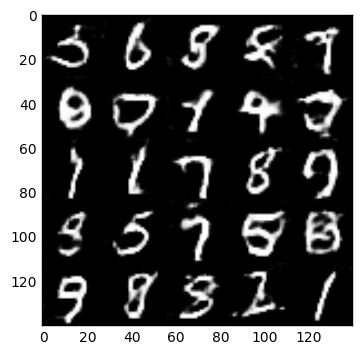

Epoch 2/2... Batch 1370... Discriminator Loss: 1.1757... Generator Loss: 0.9377
Epoch 2/2... Batch 1380... Discriminator Loss: 1.2172... Generator Loss: 0.6697


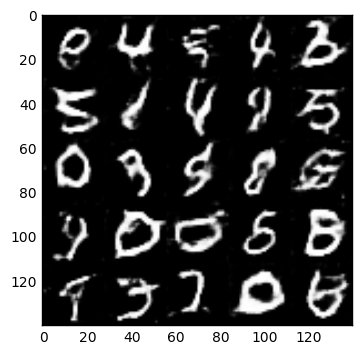

Epoch 2/2... Batch 1390... Discriminator Loss: 1.2215... Generator Loss: 0.8485
Epoch 2/2... Batch 1400... Discriminator Loss: 1.4488... Generator Loss: 0.8198


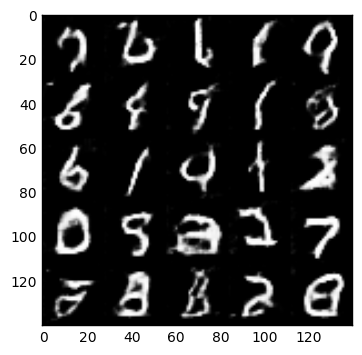

Epoch 2/2... Batch 1410... Discriminator Loss: 1.2875... Generator Loss: 0.9215
Epoch 2/2... Batch 1420... Discriminator Loss: 1.1551... Generator Loss: 1.0964


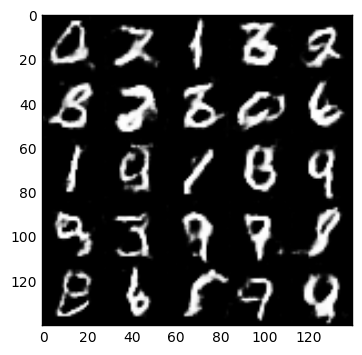

Epoch 2/2... Batch 1430... Discriminator Loss: 1.3547... Generator Loss: 0.9683
Epoch 2/2... Batch 1440... Discriminator Loss: 1.2228... Generator Loss: 1.5561


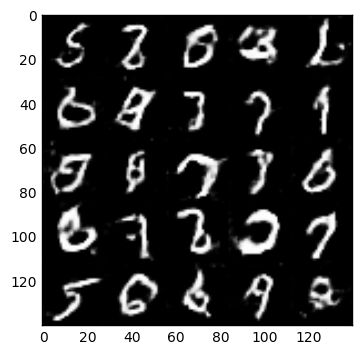

Epoch 2/2... Batch 1450... Discriminator Loss: 1.3390... Generator Loss: 0.7192
Epoch 2/2... Batch 1460... Discriminator Loss: 1.1016... Generator Loss: 0.9775


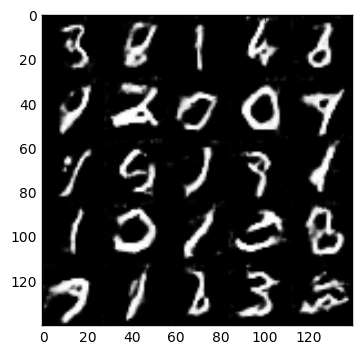

Epoch 2/2... Batch 1470... Discriminator Loss: 1.2348... Generator Loss: 0.9457
Epoch 2/2... Batch 1480... Discriminator Loss: 1.1332... Generator Loss: 1.0483


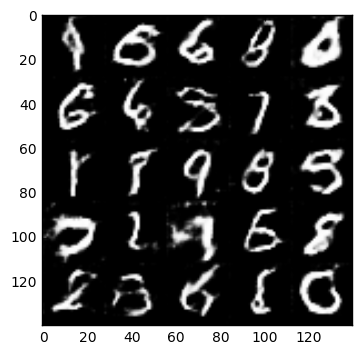

Epoch 2/2... Batch 1490... Discriminator Loss: 1.2704... Generator Loss: 0.8005
Epoch 2/2... Batch 1500... Discriminator Loss: 1.2076... Generator Loss: 1.0926


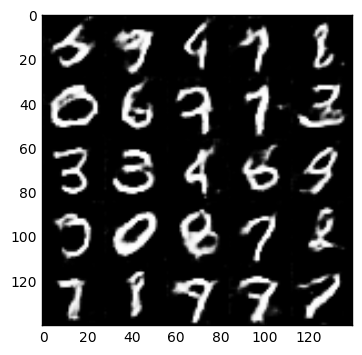

Epoch 2/2... Batch 1510... Discriminator Loss: 1.3976... Generator Loss: 0.6157
Epoch 2/2... Batch 1520... Discriminator Loss: 1.2188... Generator Loss: 1.3144


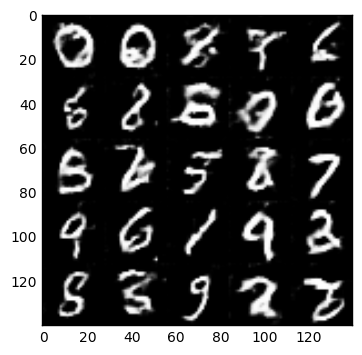

Epoch 2/2... Batch 1530... Discriminator Loss: 1.2203... Generator Loss: 0.6242
Epoch 2/2... Batch 1540... Discriminator Loss: 1.1491... Generator Loss: 1.1333


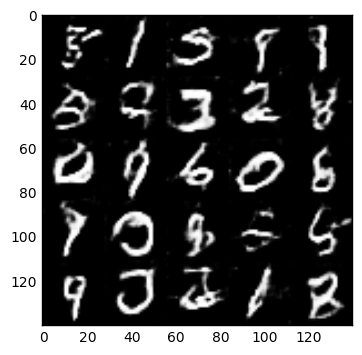

Epoch 2/2... Batch 1550... Discriminator Loss: 1.2650... Generator Loss: 0.7904
Epoch 2/2... Batch 1560... Discriminator Loss: 1.2452... Generator Loss: 0.7646


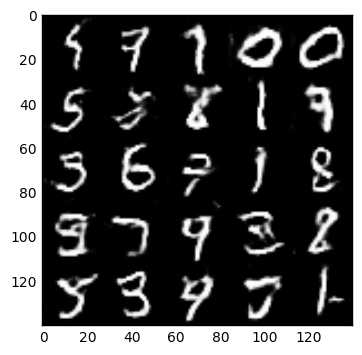

Epoch 2/2... Batch 1570... Discriminator Loss: 1.2455... Generator Loss: 0.9057
Epoch 2/2... Batch 1580... Discriminator Loss: 1.1851... Generator Loss: 0.9767


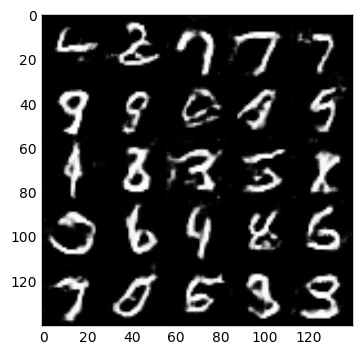

Epoch 2/2... Batch 1590... Discriminator Loss: 1.3113... Generator Loss: 1.1019
Epoch 2/2... Batch 1600... Discriminator Loss: 1.2832... Generator Loss: 1.0404


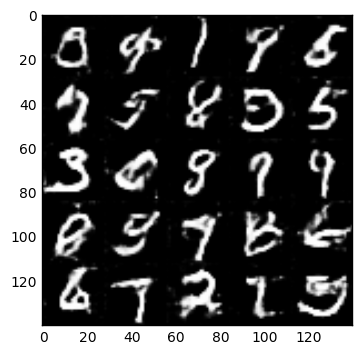

Epoch 2/2... Batch 1610... Discriminator Loss: 1.2219... Generator Loss: 1.2201
Epoch 2/2... Batch 1620... Discriminator Loss: 1.1922... Generator Loss: 0.8161


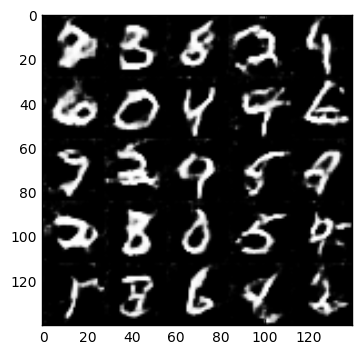

Epoch 2/2... Batch 1630... Discriminator Loss: 1.2436... Generator Loss: 0.8463
Epoch 2/2... Batch 1640... Discriminator Loss: 1.3932... Generator Loss: 0.8004


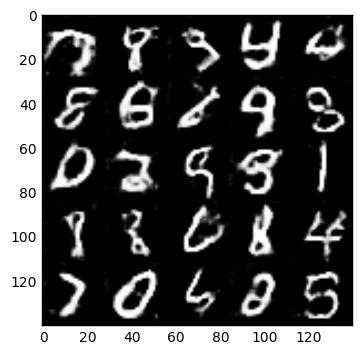

Epoch 2/2... Batch 1650... Discriminator Loss: 1.2535... Generator Loss: 0.6392
Epoch 2/2... Batch 1660... Discriminator Loss: 1.1695... Generator Loss: 0.9659


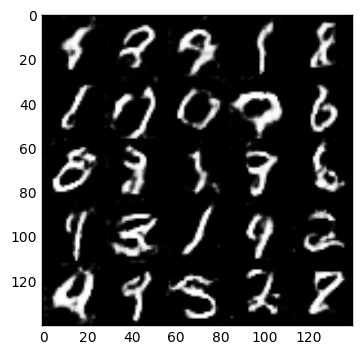

Epoch 2/2... Batch 1670... Discriminator Loss: 1.2136... Generator Loss: 0.7885
Epoch 2/2... Batch 1680... Discriminator Loss: 0.9943... Generator Loss: 1.0448


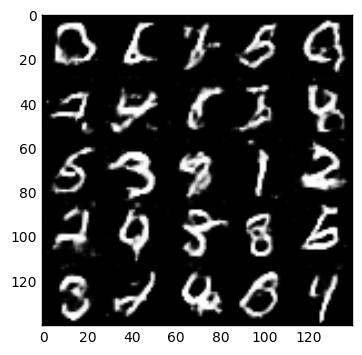

Epoch 2/2... Batch 1690... Discriminator Loss: 1.4454... Generator Loss: 1.1856
Epoch 2/2... Batch 1700... Discriminator Loss: 1.1036... Generator Loss: 1.3847


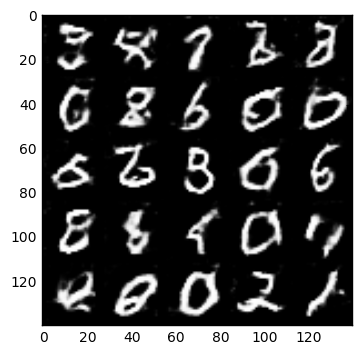

Epoch 2/2... Batch 1710... Discriminator Loss: 1.2201... Generator Loss: 1.0013
Epoch 2/2... Batch 1720... Discriminator Loss: 1.0186... Generator Loss: 0.8761


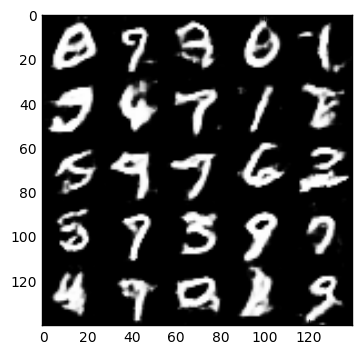

Epoch 2/2... Batch 1730... Discriminator Loss: 1.3024... Generator Loss: 0.9934
Epoch 2/2... Batch 1740... Discriminator Loss: 1.2160... Generator Loss: 1.1195


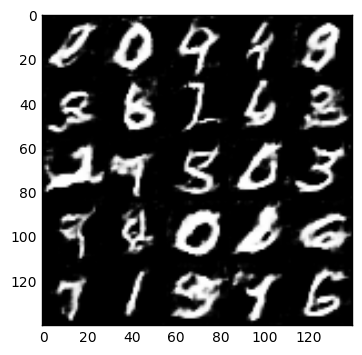

Epoch 2/2... Batch 1750... Discriminator Loss: 1.2898... Generator Loss: 1.1130
Epoch 2/2... Batch 1760... Discriminator Loss: 1.1293... Generator Loss: 1.0116


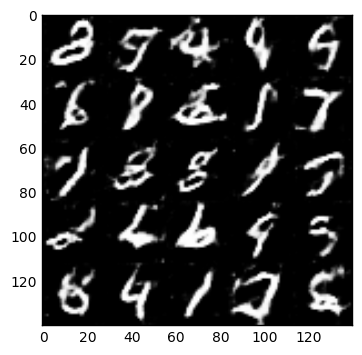

Epoch 2/2... Batch 1770... Discriminator Loss: 1.1829... Generator Loss: 1.0683
Epoch 2/2... Batch 1780... Discriminator Loss: 1.1016... Generator Loss: 1.2597


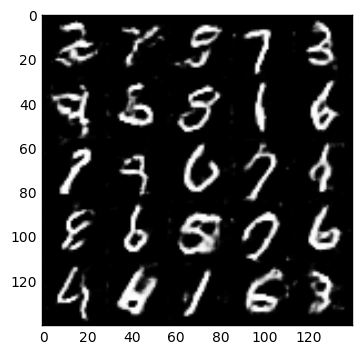

Epoch 2/2... Batch 1790... Discriminator Loss: 1.2716... Generator Loss: 0.9472
Epoch 2/2... Batch 1800... Discriminator Loss: 1.1438... Generator Loss: 1.0020


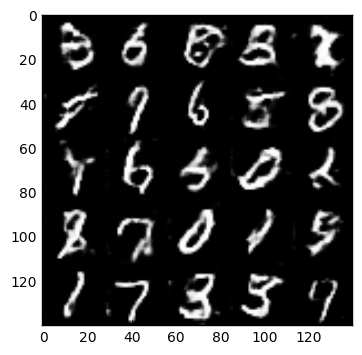

Epoch 2/2... Batch 1810... Discriminator Loss: 1.3438... Generator Loss: 0.7572
Epoch 2/2... Batch 1820... Discriminator Loss: 1.2758... Generator Loss: 1.2472


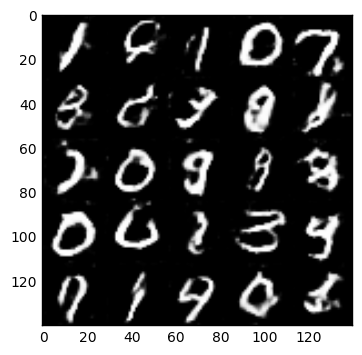

Epoch 2/2... Batch 1830... Discriminator Loss: 1.3207... Generator Loss: 0.7065
Epoch 2/2... Batch 1840... Discriminator Loss: 1.2334... Generator Loss: 1.0329


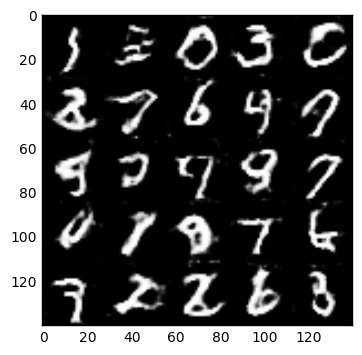

Epoch 2/2... Batch 1850... Discriminator Loss: 1.3702... Generator Loss: 0.7977
Epoch 2/2... Batch 1860... Discriminator Loss: 1.2057... Generator Loss: 0.7877


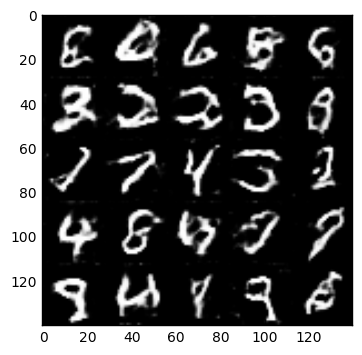

Epoch 2/2... Batch 1870... Discriminator Loss: 1.2946... Generator Loss: 1.0050


In [19]:
batch_size = 32
z_dim = 128
learning_rate = 0.0002
beta1 = 0.3


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 2

mnist_dataset = helper.Dataset('mnist', glob(os.path.join(data_dir, 'mnist/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, mnist_dataset.get_batches,
          mnist_dataset.shape, mnist_dataset.image_mode)

### CelebA
Run your GANs on CelebA.  It will take around 20 minutes on the average GPU to run one epoch.  You can run the whole epoch or stop when it starts to generate realistic faces.

In [ ]:
batch_size = 32
z_dim = 128
learning_rate = 0.0002
beta1 = 0.3

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
epochs = 1

celeba_dataset = helper.Dataset('celeba', glob(os.path.join(data_dir, 'img_align_celeba/*.jpg')))
with tf.Graph().as_default():
    train(epochs, batch_size, z_dim, learning_rate, beta1, celeba_dataset.get_batches,
          celeba_dataset.shape, celeba_dataset.image_mode)

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "helper.py" and "problem_unittests.py" files in your submission.